# Interpretable ML

- EDA
   - 시간추이에 따른 cnt의 누적분포 : sns.kdeplot()
   - 시간추이에 따른 cnt의 변화량 : sns.lineplot()
   - 시간추이에 따른 numeric feature의 변화량 : sns.lineplot()
   - feature간 상관관계 : sns.heatmap()
      - cmap 설정 : cmap = sns.diverging_palette(230, 20, cmap=True)
      - 히트맵의 분할표면 설정 : 트라이앵글 행렬 : np.triu(np.ones_like(corr), dtype=bool)
   - feature가 상관관계 : sns.pairplot() : 각 feature간의 2차원 분포도에서, 상관관계를 표현
      - g.map_lower(sns.kdeplot) : diag 대각선 아래 분포도에 등고선 표현
      - g.mat_upper(sns.regplot) : diag 대각선 위 분포도에 분포의 선형조합 직선 표현
   - cat feature별 cnt의 평균값 그래프 : sns.barplot() : 각 feature의 unique값별 cnt의 평균값 표현
      - feature로 groupby 후 cnt를 np.mean 계산한 테이블 사용
   - cat feature별 cnt의 분포 : sns.stripplot() : 각 feature의 unique값 별 cnt의 분포 표현
      - 수직형태의 scatter 분포
- 모델링
   - train test split : 시계열 데이터는 shuffle 없이 분리 해야 한다.
   - y_train, y_test 변화량 그래프 : sns.lineplot()
   - cv 시계열 split 사용 : TimeSeriesSplit(n_splits=5, test_size=(7*2), gap=0)  
   - linear model
      - linear_transformer() : Pipeline()으로, num, cat 각각 전처리기 생성
      - linear_preprocessor() : num, cat feature 전처리 : ColumnTransformer()에서 num, cat 둘다 linear_transformer() 설정
         - reminder 인수 : transformers에 지정되지 않은 column을 drop 할지 passthrough 할지 설정
         - drop : 지정하지 않은 열 제거
         - passthrough : transformers에 지정되지 않았지만, fit에 적합하다고 판단된 데이터의 열은 통과됨
      - linear_engineering() : Pipeline()으로 전처리기, 다항회귀 PolynomialFeatures(), 변수선택VarinaceThreshold() steps로 연결
      - linear_pipeline() : Pipeline()으로 linear_engineering()과 Lasso() steps로 연결
      - linear_grid_search() : GridSearchCV()에 linear_pipeline, param_grid, cv, scoring 설정
         - scoring="neg_root_mean_squared_error"
   - tree model
      - tree_transformer() : Pipeline()으로 cat 전처리기 생성
      - tree_preprocessor() : cat feature 전처리 : ColumnTransformer()에서 tree_transformer() 설정
      - tree_engineering() : Pipeline()으로 전처리기 구성
      - tree_pipeline() : Pipeline()으로 tree_engineering()과 XGBRegressor() steps로 연결
      - tree_grid_search() : GridSearchCV()로 tree_pipeline(), param_grid, cv, scoring 설정
         - scoring="neg_root_mean_squared_error"
- 모델 performance
   - train, test 별 error = y_train - y_train_pred 
   - train, test 별 mean_squared_error()
   - train, test 별 실제값, 예측값 2차원 그래프 : sns.regplot()
   - train, test 별 error의 분포도 : sns.kdeplot()
   - train, test 별 perdict의 실제값과 비교 : sns.lineplot()
- linear model interpreated
   - feature, interaction feature 들의 coef 값 비교 : pd.DataFrame().style.background_gradient() : 데이터프레임에 크기 순으로 색을 입혀서 표현 가능
   - coef_ * transform X_train : 스케일 없는 가중치 효과 : sns.stripplot(), sns.barplot() 
- tree model interpreated
   - 중요 feature 당 XGBoost 모형의 평가 지표를 사용하여 나타낼 수 있음
      - df.melt(id_vars="feature")
- PDP, ICE
   - 특정 feature가 target에 어떻게 영향을 끼치는지 확인
      - 1-way PDP : feature와 target, 
      - 2-way PDP : 상호작용 feature와 target
      - ICE는 개별 데이터 샘플의 영향도
   - 이외에 다른 유용한 평가 그래프 : 누적 국소 효과 accumulated local effect (ALE)
      - https://christophm.github.io/interpretable-ml-book/ale.html
- permutation importance (순열 중요성)
   - sklearn 참고 정확하게 모르겠음
   - pi = permutation_importance(estimator=linear_model, X=X_train, y=y_train, n_repeats=10)
   - 상관관계를 고려한 순열중요도 : spearman 상관계수를 사용한 하이어라키 그래프

** 실행 에러 **
- 히트맵의 에러들
   - annot=True 숫자 안나옴
   - plt.grid(False) 그리드 완전히 안 없어짐
   - 등
   - 버전 0.12.2 에러 ---> 버전 업그레이드 ---> pip install seaborn --upgrade

** 참조 **
- "Interpretable Machine Learning"
   - https://christophm.github.io/interpretable-ml-book/
- "Interpretable Machine Learning with Python"
   - https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python
- "Be careful when interpreting predictive models in search of causal insights"
   - https://towardsdatascience.com/be-careful-when-interpreting-predictive-models-in-search-of-causal-insights-e68626e664b6
   
** Data **
- Bike Sharing Dataset

In [1]:
!conda list "^(python|scikit|pandas|numpy|seaborn)"

# packages in environment at C:\DS\Anaconda3\envs\dev_env:
#
# Name                    Version                   Build  Channel
numpy                     1.26.4          py310h055cbcc_0  
numpy-base                1.26.4          py310h65a83cf_0  
pandas                    2.2.1           py310h5da7b33_0  
python                    3.10.13              h966fe2a_0  
python-dateutil           2.8.2              pyhd3eb1b0_0  
python-fastjsonschema     2.16.2          py310haa95532_0  
python-flatbuffers        2.0                pyhd3eb1b0_0  
python-json-logger        2.0.7           py310haa95532_0  
python-tzdata             2023.3             pyhd3eb1b0_0  
scikit-learn              1.3.0           py310h4ed8f06_1  
seaborn                   0.13.2                   pypi_0    pypi


## Prepare Notebook
- plt, sns 설정

In [2]:
import matplotlib.ticker as mtick
sns.set_style(style="darkgrid", rc={"axes.facecolor": ".9", "grid.color": ".8"})
sns.set_palette(palette="deep")
sns_c = sns.color_palette(palette="deep")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100

In [3]:
plt.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': ['-layers', 'OptimizePlus'],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '.9',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': True,
          'axes.grid.axis': 'both',


## 1. Model Development
- using linear model and tree ensemble

### Read Data

In [4]:
data_path = 'https://raw.githubusercontent.com/christophM/interpretable-ml-book/master/data/bike.csv'

raw_data_df = pd.read_csv(data_path)
raw_data_df.head(10)

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt,days_since_2011
0,WINTER,2011,JAN,NO HOLIDAY,SAT,NO WORKING DAY,MISTY,8.175849,80.5833,10.749882,985,0
1,WINTER,2011,JAN,NO HOLIDAY,SUN,NO WORKING DAY,MISTY,9.083466,69.6087,16.652113,801,1
2,WINTER,2011,JAN,NO HOLIDAY,MON,WORKING DAY,GOOD,1.229108,43.7273,16.636703,1349,2
3,WINTER,2011,JAN,NO HOLIDAY,TUE,WORKING DAY,GOOD,1.400000,59.0435,10.739832,1562,3
4,WINTER,2011,JAN,NO HOLIDAY,WED,WORKING DAY,GOOD,2.666979,43.6957,12.522300,1600,4
5,WINTER,2011,JAN,NO HOLIDAY,THU,WORKING DAY,GOOD,1.604356,51.8261,6.000868,1606,5
6,WINTER,2011,JAN,NO HOLIDAY,FRI,WORKING DAY,MISTY,1.236534,49.8696,11.304642,1510,6
7,WINTER,2011,JAN,NO HOLIDAY,SAT,NO WORKING DAY,MISTY,-0.245000,53.5833,17.875868,959,7
8,WINTER,2011,JAN,NO HOLIDAY,SUN,NO WORKING DAY,GOOD,-1.498349,43.4167,24.250650,822,8
9,WINTER,2011,JAN,NO HOLIDAY,MON,WORKING DAY,GOOD,-0.910849,48.2917,14.958889,1321,9


In [5]:
raw_data_df.tail(3)

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt,days_since_2011
728,WINTER,2012,DEC,NO HOLIDAY,SAT,NO WORKING DAY,MISTY,3.906651,75.2917,8.333661,1341,728
729,WINTER,2012,DEC,NO HOLIDAY,SUN,NO WORKING DAY,GOOD,4.024151,48.3333,23.500518,1796,729
730,WINTER,2012,DEC,NO HOLIDAY,MON,WORKING DAY,MISTY,2.144151,57.7500,10.374682,2729,730


In [6]:
raw_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   season           731 non-null    object 
 1   yr               731 non-null    int64  
 2   mnth             731 non-null    object 
 3   holiday          731 non-null    object 
 4   weekday          731 non-null    object 
 5   workingday       731 non-null    object 
 6   weathersit       731 non-null    object 
 7   temp             731 non-null    float64
 8   hum              731 non-null    float64
 9   windspeed        731 non-null    float64
 10  cnt              731 non-null    int64  
 11  days_since_2011  731 non-null    int64  
dtypes: float64(3), int64(3), object(6)
memory usage: 68.7+ KB


#### 결측값 확인

In [7]:
raw_data_df.isnull().sum()

season             0
yr                 0
mnth               0
holiday            0
weekday            0
workingday         0
weathersit         0
temp               0
hum                0
windspeed          0
cnt                0
days_since_2011    0
dtype: int64

#### 수치형 feature의 통계
- mean, std 확인 후 스케일링 결정 여부

In [8]:
raw_data_df.describe()

,yr,temp,hum,windspeed,cnt,days_since_2011
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,2011.500684,15.283085,62.789406,12.762576,4504.348837,365.000000
std,0.500342,8.603397,14.242910,5.192357,1937.211452,211.165812
min,2011.000000,-5.220871,0.000000,1.500244,22.000000,0.000000
25%,2011.000000,7.842925,52.000000,9.041650,3152.000000,182.500000
50%,2012.000000,15.421651,62.666700,12.125325,4548.000000,365.000000
75%,2012.000000,22.804575,73.020850,15.625371,5956.000000,547.500000
max,2012.000000,32.498349,97.250000,34.000021,8714.000000,730.000000


In [9]:
raw_data_df.describe().loc["std"]

yr                    0.500342
temp                  8.603397
hum                  14.242910
windspeed             5.192357
cnt                1937.211452
days_since_2011     211.165812
Name: std, dtype: float64

In [10]:
raw_data_df.describe().loc["mean"]

yr                 2011.500684
temp                 15.283085
hum                  62.789406
windspeed            12.762576
cnt                4504.348837
days_since_2011     365.000000
Name: mean, dtype: float64

#### feature 별 unique 값의 갯수

In [9]:
for col in raw_data_df.columns : 
    print(f"{col} : {len(raw_data_df[col].unique())}")

season : 4
yr : 2
mnth : 12
holiday : 2
weekday : 7
workingday : 2
weathersit : 3
temp : 499
hum : 595
windspeed : 650
cnt : 696
days_since_2011 : 731


### EDA

### cnt의 분포와 시간경과에 따른 cnt의 변화량 그래프
- cnt 분포
   - 밀도가 가장 높은 지점은 4504 이며, cnt 데이터의 평균에 해당한다.
   - 분포 자체는 다봉 분포 형태이다.
- cnt 변화 그래프
   - 시간이 경과할 수록 전체적인 cnt의 값은 증가한다.
   - 300~400일 경과한 지점에서 cnt가 감소하는 추세이다.
   - 가장 큰 값은 8714이고, 623 경과한 지점이다.
   - 가장 작은 값은 22이고, 667 경과한 지점이다.
   - 계절적인 특성이 보인다.
- 쓸만한 인사이트
   - 뚜렷한 계절성과 점차 증가하는 경향

In [11]:
print("cnt 평균 : ", raw_data_df["cnt"].mean())

cnt 평균 :  4504.3488372093025


In [12]:
cnt_max = raw_data_df["cnt"].max()
cnt_min = raw_data_df["cnt"].min()

print(f"cnt min {cnt_min}")
print(f"cnt max {cnt_max}")

cnt min 22
cnt max 8714


In [13]:
raw_data_df[(raw_data_df["cnt"] == cnt_max) | 
            (raw_data_df["cnt"] == cnt_min)]["days_since_2011"]

623    623
667    667
Name: days_since_2011, dtype: int64

In [14]:
%matplotlib inline

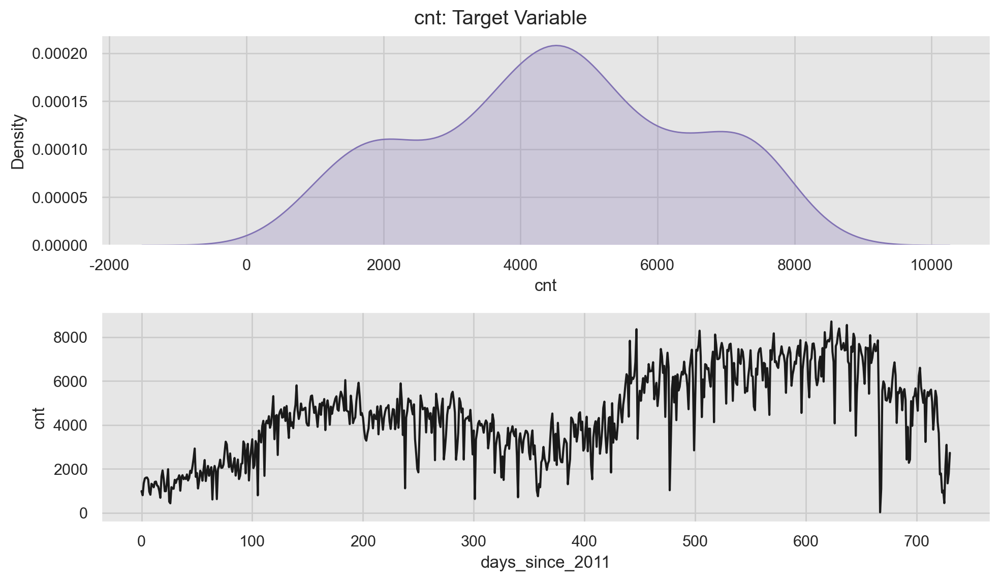

In [15]:
fig, ax = plt.subplots(nrows=2, ncols=1)
sns.kdeplot(x="cnt", data=raw_data_df, fill=True, color="m", ax=ax[0])
sns.lineplot(x="days_since_2011", y="cnt", data=raw_data_df, color="k", ax=ax[1])
fig.suptitle("cnt: Target Variable", y=0.95)
plt.tight_layout()
plt.show() ; 

### 시간경과에 따른 수치형 feature들의 변화량

In [16]:
sns_c

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [17]:
numeric_features = ["temp", "hum", "windspeed", "days_since_2011", "yr"]
target = "cnt"

numeric_features, target

(['temp', 'hum', 'windspeed', 'days_since_2011', 'yr'], 'cnt')

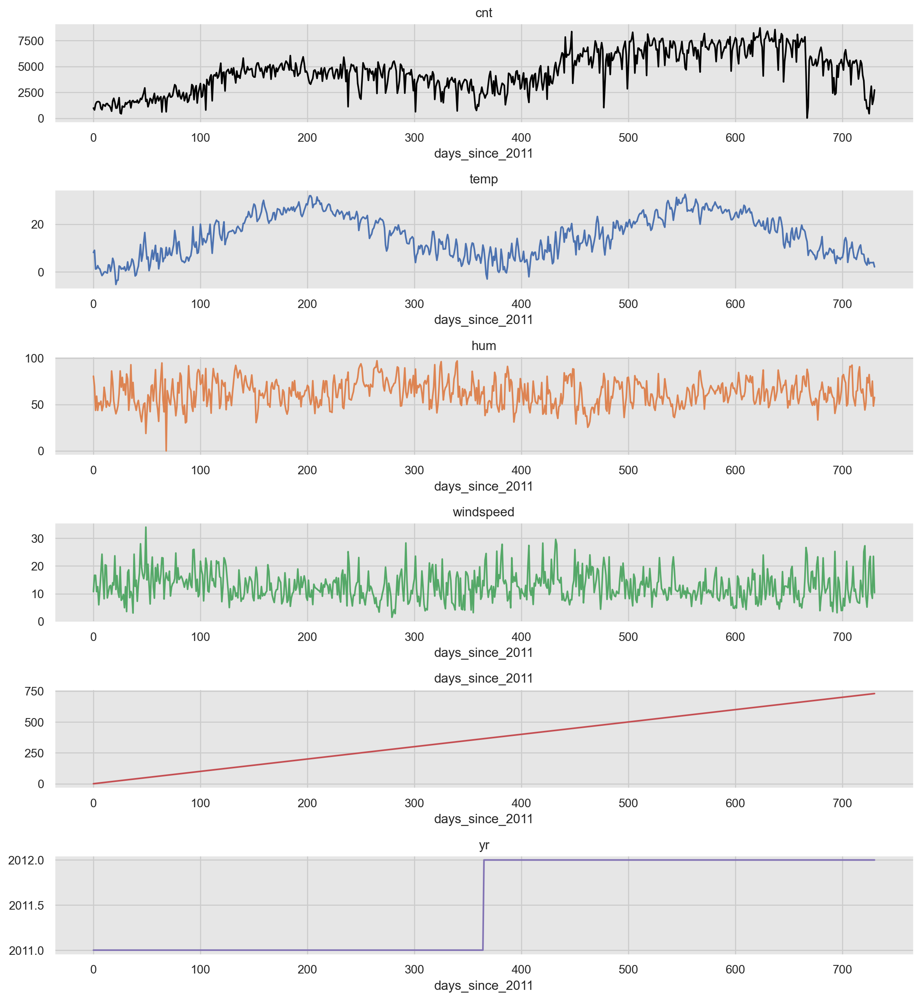

In [18]:
fit, axes = plt.subplots(
    nrows=len(numeric_features)+1,
    ncols=1,
    figsize=(12, 13),
    constrained_layout=True
)

sns.lineplot(
    x="days_since_2011",
    y=target,
    data=raw_data_df,
    color="black",
    ax=axes[0]
)
axes[0].set(title=target, ylabel=None)

for i, feature in enumerate(numeric_features) : 
    ax = axes[i+1]
    sns.lineplot(
        x="days_since_2011",
        y=feature,
        data=raw_data_df, 
        color=sns_c[i],
        ax=ax
    )
    ax.set(title=feature, ylabel=None)

plt.tight_layout()
plt.show() ;

### 히트맵 : correlation 계산

In [19]:
corr_df = raw_data_df[numeric_features + [target]].corr()
corr_df

,temp,hum,windspeed,days_since_2011,yr,cnt
temp,1.000000,0.126963,-0.157944,0.150580,0.047604,0.627494
hum,0.126963,1.000000,-0.248489,0.016375,-0.110651,-0.100659
windspeed,-0.157944,-0.248489,1.000000,-0.112620,-0.011817,-0.234545
days_since_2011,0.150580,0.016375,-0.112620,1.000000,0.866025,0.628830
yr,0.047604,-0.110651,-0.011817,0.866025,1.000000,0.566710
cnt,0.627494,-0.100659,-0.234545,0.628830,0.566710,1.000000


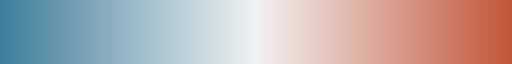

In [20]:
# 히트맵의 cmap 설정 : pos, neg 값 설정

cmap = sns.diverging_palette(230, 20, as_cmap=True)
cmap

In [21]:
# np.triu() : 트라이앵글 행렬 생성, np.ones_like() : arr과 같은 크기의 1행렬 생성 

mask = np.triu(np.ones_like(corr_df, dtype=bool))
mask

array([[ True,  True,  True,  True,  True,  True],
       [False,  True,  True,  True,  True,  True],
       [False, False,  True,  True,  True,  True],
       [False, False, False,  True,  True,  True],
       [False, False, False, False,  True,  True],
       [False, False, False, False, False,  True]])

In [22]:
np.ones_like(corr_df)

array([[1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1.]])

In [23]:
np.ones_like(corr_df, dtype=bool)

array([[ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True]])

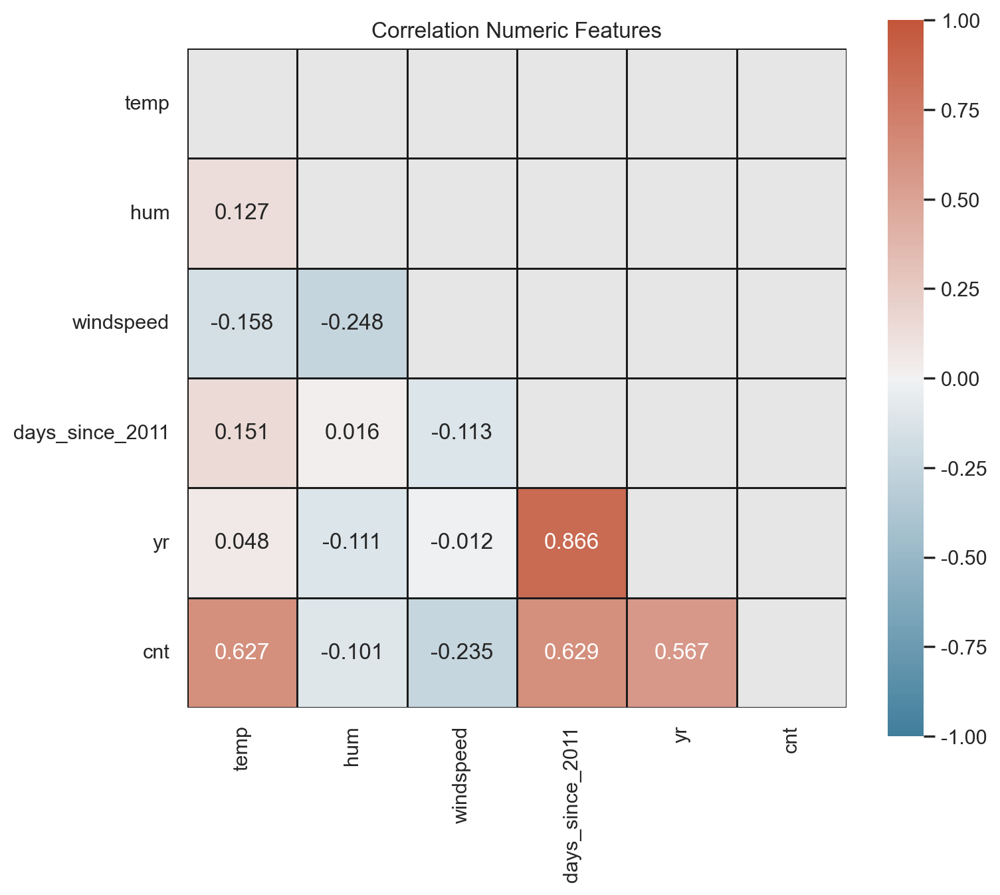

In [24]:
fig, ax = plt.subplots(figsize=(8, 7))
h = sns.heatmap(
    data=corr_df,
    mask=mask, # 트라이앵글 행렬 
    cmap=cmap, # cmap
    vmax=1.0, # color bar의 최대
    vmin=-1.0, # color bar의 최소
    center=0, # cmap의 중아값
    square=True,
    linewidths=0.5, # 라인 두께
    linecolor="k", # 라인 색
    annot=True, # 데이터 표시
    fmt=".3f", # 데이터 형식
    ax=ax
)
h.set_xticklabels(h.get_xticklabels(), rotation=90)
h.set_yticklabels(h.get_yticklabels(), rotation=0)
ax.set(title="Correlation Numeric Features")

plt.grid(False)
plt.show() ; 

### 각 feature 간 상관관계 분포

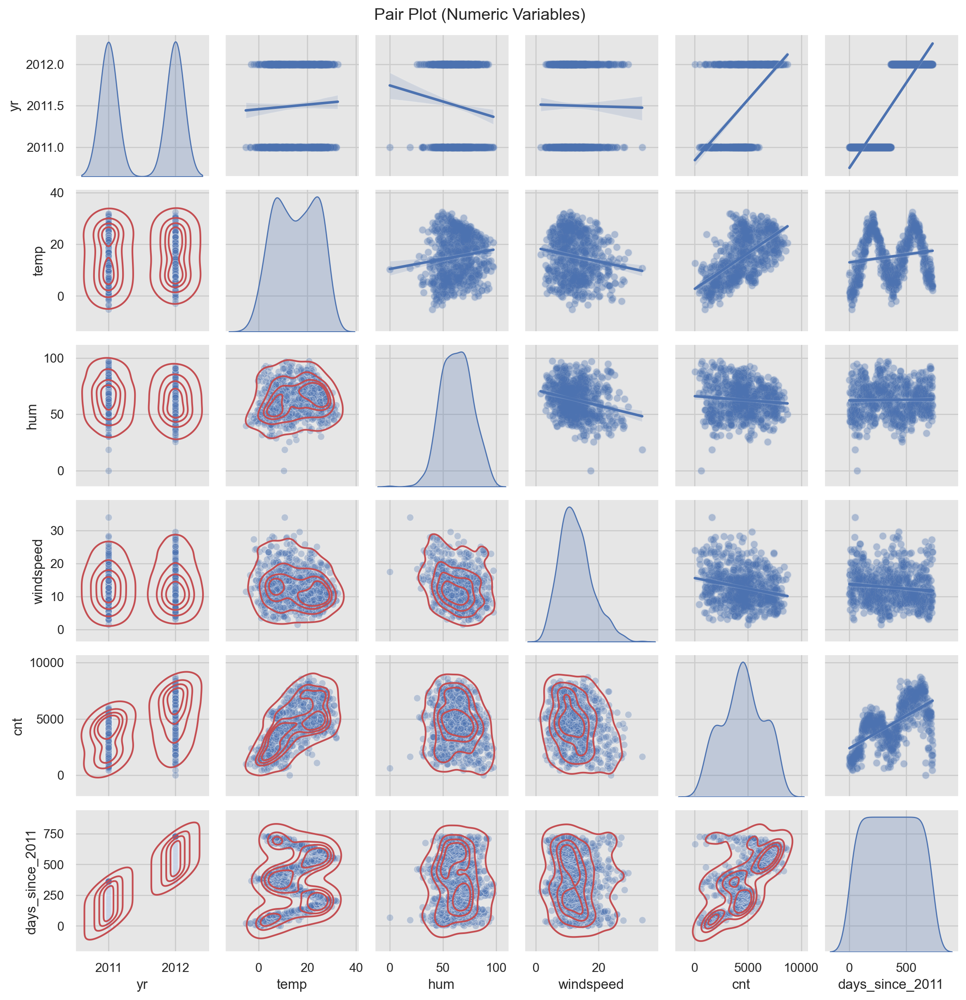

In [25]:
g = sns.pairplot(
    data=raw_data_df,
    diag_kind="kde",
    height=2,
    corner=False,
    plot_kws={"alpha": 0.3}
)

# g.map_lower() : 대각선 아래 그래프에 적용
# g.map_upper() : 대각선 위 그래프에 적용
g.map_lower(sns.kdeplot, levels=5, color=sns_c[3]) # levels : 등고선의 층수
g.map_upper(sns.regplot, color=sns_c[0], scatter_kws={"alpha": 0.1})
g.fig.suptitle("Pair Plot (Numeric Variables)", y=1.01) ;

### categorical features별 평균 cnt

In [26]:
numeric_features

['temp', 'hum', 'windspeed', 'days_since_2011', 'yr']

In [27]:
categorical_features = [col for col in raw_data_df.columns \
                       if (col not in numeric_features) & (col != "cnt")]
categorical_features

['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']

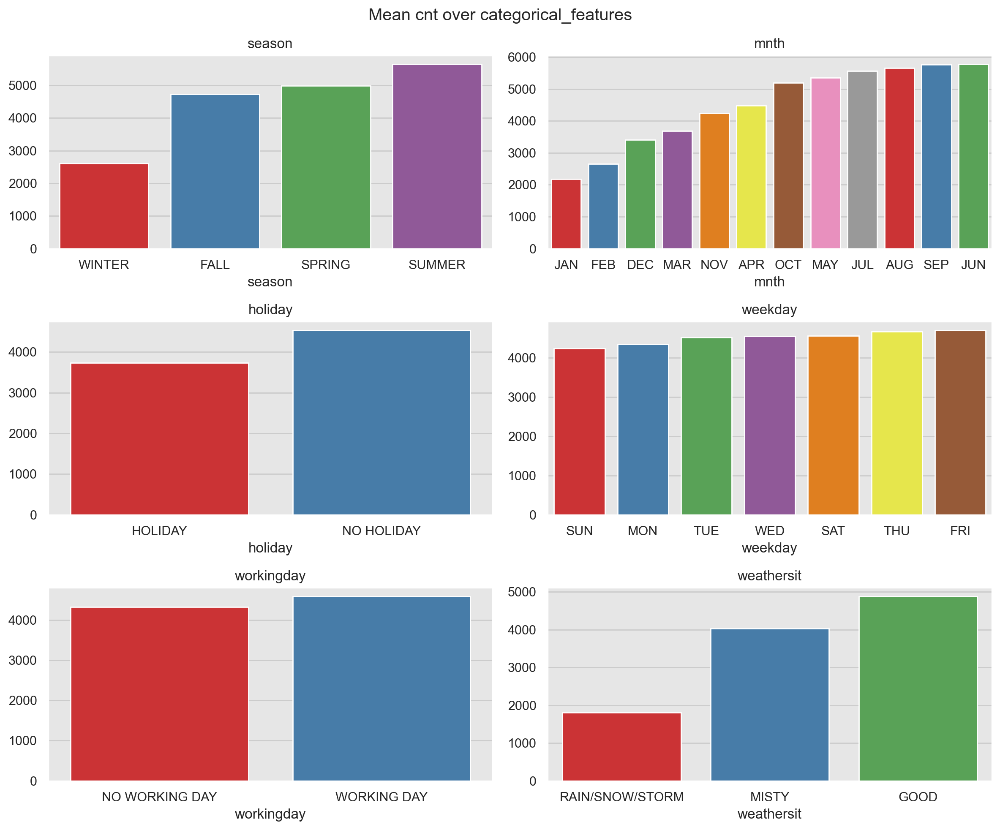

In [28]:
fit, axes = plt.subplots(nrows=3, 
                         ncols=2, 
                         figsize=(12, 10), 
                         constrained_layout=True)

axes = axes.flatten()

for i, feature in enumerate(categorical_features) : 
    
    ax = axes[i]
    feature_df = raw_data_df\
                    .groupby(feature, as_index=False)\
                    .agg({target: np.mean})\
                    .sort_values(target)
    sns.barplot(
        x=feature,
        y=target,
        data=feature_df,
        palette="Set1",
        dodge=False,
        ax=ax
    )
    ax.set(title=feature, ylabel=None)
    
fit.suptitle(f"Mean {target} over categorical_features")
plt.tight_layout()
plt.show() ; 

### categorical features별 cnt의 분포
- 추운 달은 더운 달 보다 cnt가 낮다.
- working day가 no working day 보다 cnt가 높다.
- no holiday 가 holiday 보다 cnt가 훨씬 높다.

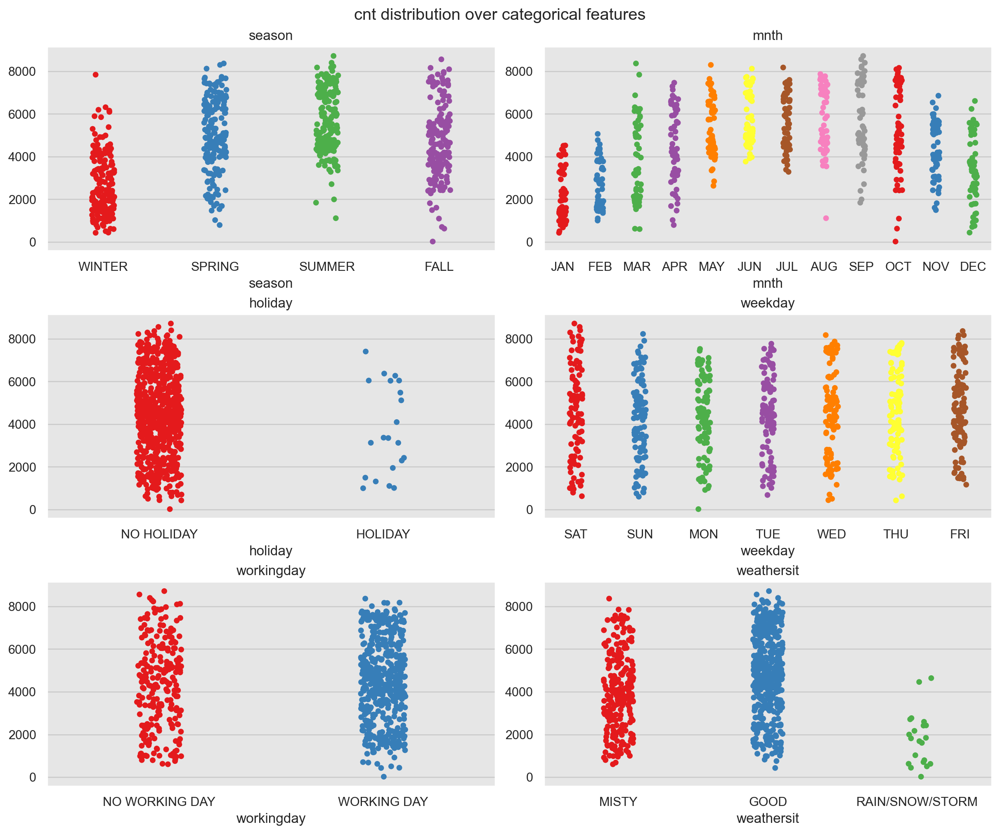

In [29]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10), constrained_layout=True)
axes = axes.flatten()

for i, feature in enumerate(categorical_features) : 
    
    ax = axes[i]
    sns.stripplot(x=feature, 
                  y=target, 
                  data=raw_data_df, 
                  dodge=False, 
                  palette="Set1", 
                  ax=ax)
    ax.set(title=feature, ylabel=None)
    
fig.suptitle(f"{target} distribution over categorical features") ; 

### 계절과 달의 문제
- 계절이 바뀌는 달은 mnth featuer에 두개의 season feature가 겹쳐 있음
- 모델의 학습에 그대로 적용하여 어떻게 해석될 수 있는지 확인 한다.

In [30]:
raw_data_df.groupby("season").agg({"mnth": np.unique})

,mnth
season,
FALL,"[DEC, NOV, OCT, SEP]"
SPRING,"[APR, JUN, MAR, MAY]"
SUMMER,"[AUG, JUL, JUN, SEP]"
WINTER,"[DEC, FEB, JAN, MAR]"


In [31]:
raw_data_df.groupby("mnth").agg({"season": np.unique})

,season
mnth,
APR,[SPRING]
AUG,[SUMMER]
DEC,"[FALL, WINTER]"
FEB,[WINTER]
JAN,[WINTER]
JUL,[SUMMER]
JUN,"[SPRING, SUMMER]"
MAR,"[SPRING, WINTER]"
MAY,[SPRING]


### Train Test set split
- 시계열 데이터의 문제로 shuffle 없이 분리
- y_train, y_test의 분포를 시각화
- 2011과 2012년의 변동성과 추세는 차이가 있다.

In [32]:
from sklearn.model_selection import train_test_split

In [34]:
# train_test_split의 shuffle=False

X = raw_data_df.copy().drop([target], axis=1)
y = raw_data_df.copy()[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2,random_state=42, shuffle=False
)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((584, 11), (147, 11), (584,), (147,))

In [35]:
sns_c

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

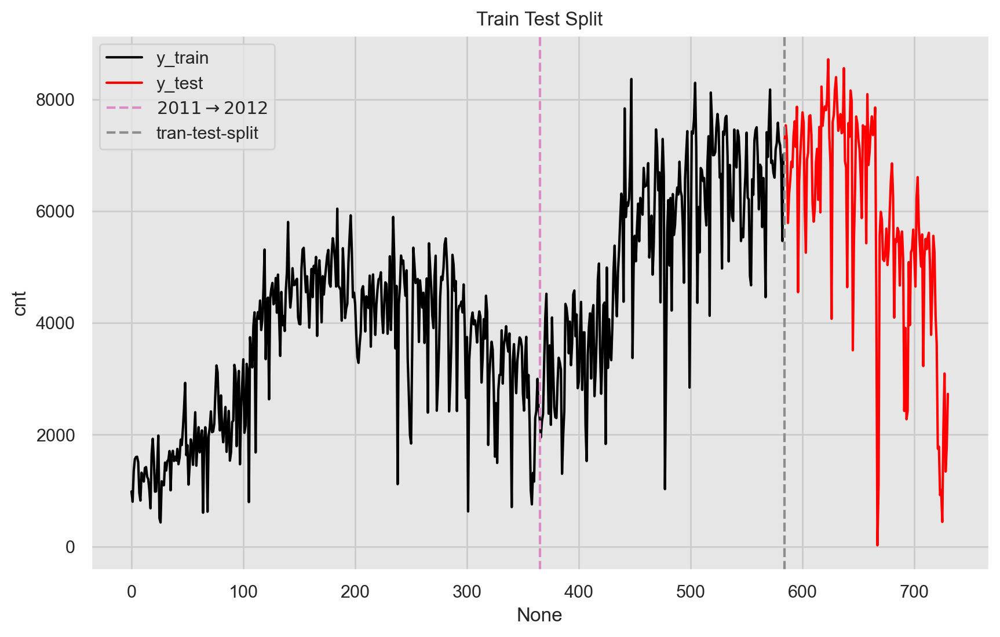

In [36]:
fig, ax = plt.subplots()

sns.lineplot(x=y_train.index, y=y_train, color="black", label="y_train", ax=ax)
sns.lineplot(x=y_test.index, y=y_test, color="red", label="y_test", ax=ax)
ax.axvline(x=365, color=sns_c[6], linestyle="--", 
           label=r"$2011 \rightarrow 2012$")
ax.axvline(x=y_train.shape[0], color=sns_c[7], linestyle="--", 
           label="tran-test-split")
ax.legend(loc="upper left")
ax.set(title="Train Test Split") ;

### Model Development
- preprocessing
   - scaling
   - encoding
- model
   - linear : Lasso
   - tree based : xgboost

In [37]:
!conda list "^(xgb)"

# packages in environment at C:\DS\Anaconda3\envs\dev_env:
#
# Name                    Version                   Build  Channel
xgboost                   2.0.3                    pypi_0    pypi


In [38]:
from sklearn.linear_model import Lasso
from xgboost import XGBRegressor

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures

In [39]:
categorical_features

['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']

In [40]:
numeric_features

['temp', 'hum', 'windspeed', 'days_since_2011', 'yr']

In [42]:
# target "cnt" 제외

features = categorical_features + numeric_features
features

['season',
 'mnth',
 'holiday',
 'weekday',
 'workingday',
 'weathersit',
 'temp',
 'hum',
 'windspeed',
 'days_since_2011',
 'yr']

In [43]:
# cnt를 제외한 train, test 데이터 세트

X_train = X_train[features]
X_test = X_test[features]

In [44]:
X_train.columns

Index(['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit',
       'temp', 'hum', 'windspeed', 'days_since_2011', 'yr'],
      dtype='object')

In [45]:
X_test.columns

Index(['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit',
       'temp', 'hum', 'windspeed', 'days_since_2011', 'yr'],
      dtype='object')

### numeric, categorical feature 전처리 파이프라인 설정

In [46]:
numeric_transformer = Pipeline(steps=[
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("one_hot", OneHotEncoder())
])

In [47]:
numeric_transformer

Pipeline(steps=[('scaler', StandardScaler())])

In [48]:
categorical_transformer

Pipeline(steps=[('one_hot', OneHotEncoder())])

### 전처리 features 
- 범주형 feature 를 one hot encoding 하면 unique 값 별로 새로운 feature 가 생성된다.
   - numeric : StandardScaler()
   - categorical : OneHotEncoder()
- feature 전처리 이후 PolynomialFeatures() 를 사용하여 상호작용을 적용하고,
- VarianceThreshold() 를 사용하여 변수선택을 하게 된다.

In [49]:
categorical_features_ext = list(categorical_transformer["one_hot"]\
                                .fit(X_train[categorical_features])\
                                .get_feature_names_out(categorical_features))
categorical_features_ext

['season_FALL',
 'season_SPRING',
 'season_SUMMER',
 'season_WINTER',
 'mnth_APR',
 'mnth_AUG',
 'mnth_DEC',
 'mnth_FEB',
 'mnth_JAN',
 'mnth_JUL',
 'mnth_JUN',
 'mnth_MAR',
 'mnth_MAY',
 'mnth_NOV',
 'mnth_OCT',
 'mnth_SEP',
 'holiday_HOLIDAY',
 'holiday_NO HOLIDAY',
 'weekday_FRI',
 'weekday_MON',
 'weekday_SAT',
 'weekday_SUN',
 'weekday_THU',
 'weekday_TUE',
 'weekday_WED',
 'workingday_NO WORKING DAY',
 'workingday_WORKING DAY',
 'weathersit_GOOD',
 'weathersit_MISTY',
 'weathersit_RAIN/SNOW/STORM']

In [50]:
# onehotencoding한 cat features와 numeric features를 합한 features
# 이 features가 모형의 fitting에서 사용된다

features_ext = categorical_features_ext + numeric_features
features_ext

['season_FALL',
 'season_SPRING',
 'season_SUMMER',
 'season_WINTER',
 'mnth_APR',
 'mnth_AUG',
 'mnth_DEC',
 'mnth_FEB',
 'mnth_JAN',
 'mnth_JUL',
 'mnth_JUN',
 'mnth_MAR',
 'mnth_MAY',
 'mnth_NOV',
 'mnth_OCT',
 'mnth_SEP',
 'holiday_HOLIDAY',
 'holiday_NO HOLIDAY',
 'weekday_FRI',
 'weekday_MON',
 'weekday_SAT',
 'weekday_SUN',
 'weekday_THU',
 'weekday_TUE',
 'weekday_WED',
 'workingday_NO WORKING DAY',
 'workingday_WORKING DAY',
 'weathersit_GOOD',
 'weathersit_MISTY',
 'weathersit_RAIN/SNOW/STORM',
 'temp',
 'hum',
 'windspeed',
 'days_since_2011',
 'yr']

In [51]:
print(f"Number of features before pre-processing: {len(features)}")
print(f"Number of features after pre-processing: {len(features_ext)}")

Number of features before pre-processing: 11
Number of features after pre-processing: 35


In [52]:
", ".join(features_ext)

'season_FALL, season_SPRING, season_SUMMER, season_WINTER, mnth_APR, mnth_AUG, mnth_DEC, mnth_FEB, mnth_JAN, mnth_JUL, mnth_JUN, mnth_MAR, mnth_MAY, mnth_NOV, mnth_OCT, mnth_SEP, holiday_HOLIDAY, holiday_NO HOLIDAY, weekday_FRI, weekday_MON, weekday_SAT, weekday_SUN, weekday_THU, weekday_TUE, weekday_WED, workingday_NO WORKING DAY, workingday_WORKING DAY, weathersit_GOOD, weathersit_MISTY, weathersit_RAIN/SNOW/STORM, temp, hum, windspeed, days_since_2011, yr'

### Linear Model
- transformer
   - numeric_transformer : StandardScaler()
   - categorical_transformer : OneHotEncoder()
- linear_preprocessor : ColumnTransformer()를 사용하여 num, cat feature를 전처리기를 연결함
   - reminder 인수 : transformers에 지정되지 않은 column을 drop 할지 passthrough 할지 설정
   - drop : 지정하지 않은 열 제거
   - passthrough : transformers에 지정되지 않았지만, fit에 적합하다고 판단된 데이터의 열은 통과됨
- linear_feature_engineering : Pipeline()을 사용하여 feature 전처리기, 다항회귀, 변수선택을 순차적으로 실행하는 파이프라인
   - linear_preprocessor
   - PolynomialFeatures
   - VarianceThreshold
- linear_pipeline : engineering 변환기와 Lasso() 모형을 실행하는 파이프라인   
   - linear_feature_engineering : feature 전처리기, 다항회귀, 변수선택을 실행
   - Lasso : 입력 feature 간의 2차 곱셈 상호작용을 사용하는 회귀모델

In [53]:
# categorical_transformer : Pipeline(steps=[("onehot")])
# numeric_transformer : Pipeline(steps=[("scaler")])

linear_preprocessor = ColumnTransformer(transformers=[
    ("cat", categorical_transformer, categorical_features),
    ("num", numeric_transformer, numeric_features)
], remainder="passthrough")

linear_preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('cat',
                                 Pipeline(steps=[('one_hot', OneHotEncoder())]),
                                 ['season', 'mnth', 'holiday', 'weekday',
                                  'workingday', 'weathersit']),
                                ('num',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['temp', 'hum', 'windspeed', 'days_since_2011',
                                  'yr'])])

In [54]:
linear_feature_engineering = Pipeline(
    steps=[
        ("linear_preprocessing", linear_preprocessor),
        ("polynomial", PolynomialFeatures(degree=2, 
                                          interaction_only=True, 
                                          include_bias=False)),
        ("varinace_threshold", VarianceThreshold())
    ]
)

linear_feature_engineering

Pipeline(steps=[('linear_preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('one_hot',
                                                                   OneHotEncoder())]),
                                                  ['season', 'mnth', 'holiday',
                                                   'weekday', 'workingday',
                                                   'weathersit']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['temp', 'hum', 'windspeed',
                                                   'days_since_2011',
                                                   'yr'])])),
                ('polynomial',
                 PolynomialFeatures(include_bias=False, interaction_only=True)),
                ('varinace_threshold', VarianceThreshold())])

In [55]:
linear_pipeline = Pipeline(
    steps=[
        ("linear_feature_engineering", linear_feature_engineering),
        ("linear_regressor", Lasso())
    ]
)

linear_pipeline

Pipeline(steps=[('linear_feature_engineering',
                 Pipeline(steps=[('linear_preprocessing',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat',
                                                                   Pipeline(steps=[('one_hot',
                                                                                    OneHotEncoder())]),
                                                                   ['season',
                                                                    'mnth',
                                                                    'holiday',
                                                                    'weekday',
                                                                    'workingday',
                                                                    'weathersit']),
                                                                  ('num',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['temp',
                                                                    'hum',
                                                                    'windspeed',
                                                                    'days_since_2011',
                                                                    'yr'])])),
                                 ('polynomial',
                                  PolynomialFeatures(include_bias=False,
                                                     interaction_only=True)),
                                 ('varinace_threshold', VarianceThreshold())])),
                ('linear_regressor', Lasso())])

### CV : 시계열 데이터의 train, test set 분리

In [56]:
cv = TimeSeriesSplit(n_splits=5, test_size=(7 * 2), gap=0)
cv

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=14)

### GridSearchCV()

In [57]:
%%time

linear_param_grid = {
    "linear_regressor__alpha": np.logspace(start=-3, stop=3, num=20)
}

linear_grid_search = GridSearchCV(
    estimator=linear_pipeline,
    param_grid=linear_param_grid,
    scoring="neg_root_mean_squared_error",
    cv=cv
)

linear_grid_search = linear_grid_search.fit(X_train, y_train)
linear_grid_search

CPU times: total: 37.4 s
Wall time: 10.3 s


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=14),
             estimator=Pipeline(steps=[('linear_feature_engineering',
                                        Pipeline(steps=[('linear_preprocessing',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat',
                                                                                          Pipeline(steps=[('one_hot',
                                                                                                           OneHotEncoder())]),
                                                                                          ['season',
                                                                                           'mnth',
                                                                                           'holiday',
                                                                                           'weekday',
                                                                                           'workingday',
                                                                                           'weathersit'...
             param_grid={'linear_regressor__alpha': array([1.00000000e-03, 2.06913808e-03, 4.28133240e-03, 8.85866790e-03,
       1.83298071e-02, 3.79269019e-02, 7.84759970e-02, 1.62377674e-01,
       3.35981829e-01, 6.95192796e-01, 1.43844989e+00, 2.97635144e+00,
       6.15848211e+00, 1.27427499e+01, 2.63665090e+01, 5.45559478e+01,
       1.12883789e+02, 2.33572147e+02, 4.83293024e+02, 1.00000000e+03])},
             scoring='neg_root_mean_squared_error')

### Tree Model
- transformer : categorical_transformer()
- tree_preprocessor() : ColumnTransforemer()를 사용하여 cat features의 one hot encoding
- tree_engineering() : Pipeline()을 사용하여 linear_preprocessor()를 step으로 적용
- tree_pipeline() : tree_engineering() 실핼 후 XGBRegressor()로 예측 실행하는 파이프라인
- tree_grid_search() : XGBRegressor()의 파라미터인 max_depth와 min_child_weight를 조합하는 param_grid를 적용한 CV

In [60]:
# categorical_transformer() : Pipeline(steps=[("onehot")])

tree_preprocessor = ColumnTransformer(
    transformers=[
        ("cat", categorical_transformer, categorical_features)
    ], remainder="passthrough"
)

tree_preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('cat',
                                 Pipeline(steps=[('one_hot', OneHotEncoder())]),
                                 ['season', 'mnth', 'holiday', 'weekday',
                                  'workingday', 'weathersit'])])

#### linear_features_engineering과의 차이
- 회귀 모형에서는 PolynomialFeatures()를 사용하여 feature 간의 상호작용 조합을 추가한 후 VarianceThreshold()로 변수선택을 하였다.
- tree 모형에서는 이 과정이 불필요하다.

In [61]:
tree_feature_engineering = Pipeline(
    steps=[
        ("tree_preprocessor", tree_preprocessor)
    ]
)

tree_feature_engineering

Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('one_hot',
                                                                   OneHotEncoder())]),
                                                  ['season', 'mnth', 'holiday',
                                                   'weekday', 'workingday',
                                                   'weathersit'])]))])

In [62]:
tree_pipeline = Pipeline(
    steps=[
        ("tree_feature_engineering", tree_feature_engineering),
        ("tree_regressor", XGBRegressor())
    ]
)

tree_pipeline

Pipeline(steps=[('tree_feature_engineering',
                 Pipeline(steps=[('tree_preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat',
                                                                   Pipeline(steps=[('one_hot',
                                                                                    OneHotEncoder())]),
                                                                   ['season',
                                                                    'mnth',
                                                                    'holiday',
                                                                    'weekday',
                                                                    'workingday',
                                                                    'weathersit'])]))])),
                ('tree_regressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_byle...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

### GridSearchCV()
- cv = TimeSeriesSplit(n_split=5, size=(7*5), gap=0)

In [63]:
%%time

tree_param_grid = {
    "tree_regressor__min_child_weight": [0.01, 0.5, 1, 10],
    "tree_regressor__max_depth": [3, 5, 8, 13]
}

tree_grid_search = GridSearchCV(
    estimator=tree_pipeline,
    param_grid=tree_param_grid, 
    scoring="neg_root_mean_squared_error",
    cv=cv
)

tree_grid_search = tree_grid_search.fit(X_train, y_train)
tree_grid_search

CPU times: total: 2min 54s
Wall time: 16.4 s


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=14),
             estimator=Pipeline(steps=[('tree_feature_engineering',
                                        Pipeline(steps=[('tree_preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat',
                                                                                          Pipeline(steps=[('one_hot',
                                                                                                           OneHotEncoder())]),
                                                                                          ['season',
                                                                                           'mnth',
                                                                                           'holiday',
                                                                                           'weekday',
                                                                                           'workingday',
                                                                                           'weathersit'])]))...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=None, ...))]),
             param_grid={'tree_regressor__max_depth': [3, 5, 8, 13],
                         'tree_regressor__min_child_weight': [0.01, 0.5, 1,
                                                              10]},
             scoring='neg_root_mean_squared_error')

### Model Performance
- mean_squared_error : 잔차제곱합의 평균값 : 즉 잔차의 크기의 평균으로 예측값과 실제값의 차이가 작을 수록 모델의 성능이 좋은 것으로 판단할 수 있다. 
- 샘플내 성능 : X_train, y_train
- 샘플외 성능 : X_test, y_test
- mse 값이 작을 수록 성능이 좋다고 판단할 수 있다.

In [64]:
y_train_pred_linear = linear_grid_search.predict(X_train)
y_test_pred_linear = linear_grid_search.predict(X_test)

y_train_pred_tree = tree_grid_search.predict(X_train)
y_test_pred_tree = tree_grid_search.predict(X_test)

In [65]:
from sklearn.metrics import mean_squared_error

In [66]:
print(f'''
model compare : Lasso and RGBRegressor
-------------------------------
train mse (linear) : {mean_squared_error(y_train, y_train_pred_linear):.2f}
test  mse (linear) : {mean_squared_error(y_test, y_test_pred_linear):.2f}
-------------------------------
train mse (tree)   : {mean_squared_error(y_train, y_train_pred_tree):.2f}
test  mse (tree)   : {mean_squared_error(y_test, y_test_pred_tree):.2f}
-------------------------------
''')


model compare : Lasso and RGBRegressor
-------------------------------
train mse (linear) : 213555.13
test  mse (linear) : 1363559.49
-------------------------------
train mse (tree)   : 75013.40
test  mse (tree)   : 1281933.34
-------------------------------



### prediction(예측값) and error(잔차) dist
- target, prediction 그래프
   - 실제값과 예측값이 100% 일치한다면 기울기 1인 직선 형태여야 한다.
- error의 분포 그래프
   - 실제값과 예측값의 차이인 error의 분포
   - 기대값, 분산 통계값으로 분포를 설명할 수 있다. 

In [68]:
error_train_linear = y_train - y_train_pred_linear
error_test_linear = y_test - y_test_pred_linear
error_train_tree = y_train - y_train_pred_tree
error_test_tree = y_test - y_test_pred_tree

In [69]:
error_train_linear

0     -866.120353
1     -991.747860
2      -15.406114
3      112.039304
4      -82.024600
          ...    
579    -76.816749
580    685.288072
581    115.711260
582   -559.778934
583    -48.269815
Name: cnt, Length: 584, dtype: float64

In [70]:
error_test_linear

584     275.719683
585     566.821253
586     -77.165728
587    -193.474059
588     161.282586
          ...     
726   -1532.586559
727   -1590.924935
728   -2498.584944
729   -1935.246472
730   -1771.461899
Name: cnt, Length: 147, dtype: float64

In [71]:
error_train_tree

0     -116.411133
1     -403.364868
2      -20.646851
3      -33.950073
4     -110.370361
          ...    
579    148.619629
580    216.939453
581     54.404297
582   -237.605957
583    -64.915527
Name: cnt, Length: 584, dtype: float64

In [72]:
error_test_tree

584     173.411621
585     714.785645
586     435.953125
587    -923.150391
588    -474.265625
          ...     
726   -2406.619141
727   -2037.352539
728   -2955.266602
729   -2429.534180
730   -2092.049316
Name: cnt, Length: 147, dtype: float64

In [73]:
sns_c

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

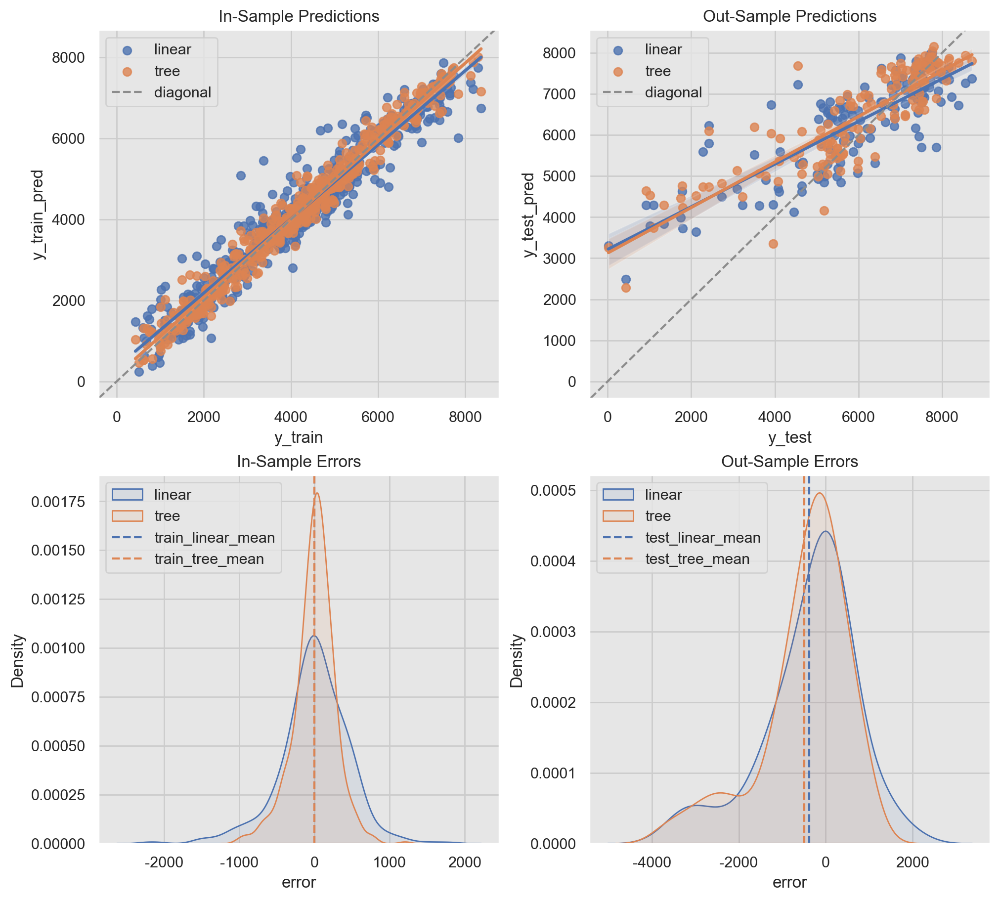

In [74]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 9), constrained_layout=True)
ax = ax.flatten()

# y_train과 y_train_pred의 분포
sns.regplot(x=y_train, y=y_train_pred_linear, 
            color=sns_c[0], label="linear", ax=ax[0])
sns.regplot(x=y_train, y=y_train_pred_tree,
            color=sns_c[1], label="tree", ax=ax[0])
ax[0].axline(xy1=(0, 0), slope=1, color=sns_c[7], linestyle="--", label="diagonal")
ax[0].legend(loc="upper left")
ax[0].set(title="In-Sample Predictions", xlabel="y_train", ylabel="y_train_pred")

# y_test와 y_test_pred의 분포
sns.regplot(x=y_test, y=y_test_pred_linear,
            color=sns_c[0], label="linear", ax=ax[1])
sns.regplot(x=y_test, y=y_test_pred_tree, 
            color=sns_c[1], label="tree", ax=ax[1])
ax[1].axline(xy1=(0, 0), slope=1, color=sns_c[7], linestyle="--", label="diagonal")
ax[1].legend(loc="upper left")
ax[1].set(title="Out-Sample Predictions", xlabel="y_test", ylabel="y_test_pred")

# train 잔차의 누적분포
sns.kdeplot(x=error_train_linear, 
            color=sns_c[0], label="linear", fill=True, alpha=0.1, ax=ax[2])
sns.kdeplot(x=error_train_tree, 
            color=sns_c[1], label="tree", fill=True, alpha=0.1, ax=ax[2])
ax[2].axvline(x=error_train_linear.mean(), 
              color=sns_c[0], linestyle="--", label="train_linear_mean")

ax[2].axvline(x=error_train_tree.mean(), 
              color=sns_c[1], linestyle="--", label="train_tree_mean")
ax[2].legend(loc="upper left")
ax[2].set(title="In-Sample Errors", xlabel="error")

# test 잔차의 누적분포
sns.kdeplot(x=error_test_linear, 
            color=sns_c[0], label="linear", fill=True, alpha=0.1, ax=ax[3])
sns.kdeplot(x=error_test_tree, 
            color=sns_c[1], label="tree", fill=True, alpha=0.1, ax=ax[3])
ax[3].axvline(x=error_test_linear.mean(), 
              color=sns_c[0], linestyle="--", label="test_linear_mean")
ax[3].axvline(x=error_test_tree.mean(),
              color=sns_c[1], linestyle="--", label="test_tree_mean")
ax[3].legend(loc="upper left")
ax[3].set(title="Out-Sample Errors", xlabel="error") ; 

In [75]:
error_train_linear.mean(), error_train_linear.std()

(-4.072480556740081e-13, 462.5164188605271)

In [76]:
error_test_linear.mean(), error_test_linear.std()

(-376.6238601333118, 1109.090554307525)

In [77]:
error_train_tree.mean(), error_train_tree.std()

(-0.10087073339174872, 274.1205223813633)

In [78]:
error_test_tree.mean(), error_test_tree.std()

(-493.6240782445791, 1022.4382797002696)

### 시간추이에 따른 y_train과 예측값
- train 데이터

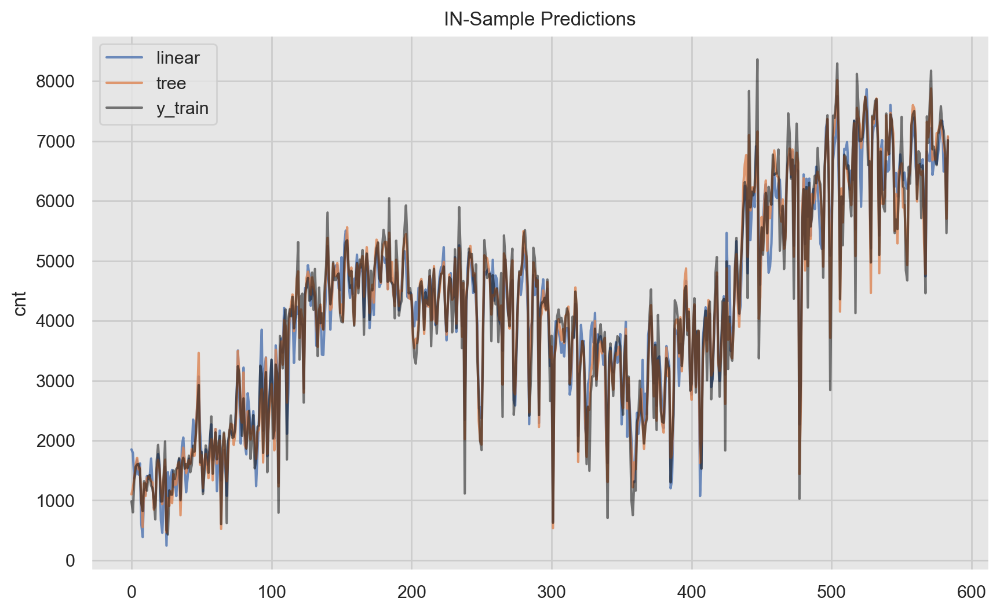

In [79]:
fig, ax = plt.subplots()

sns.lineplot(
    x=range(y_train_pred_linear.shape[0]),
    y=y_train_pred_linear,
    color=sns_c[0],
    label="linear",
    alpha=0.8,
    ax=ax
)

sns.lineplot(
    x=range(y_train_pred_tree.shape[0]),
    y=y_train_pred_tree, 
    color=sns_c[1],
    label="tree",
    alpha=0.8,
    ax=ax
)

sns.lineplot(
    x=range(y_train.shape[0]),
    y=y_train,
    color="black",
    label="y_train",
    alpha=0.5,
    ax=ax
)

ax.set(title="IN-Sample Predictions") ;

### 시간 추이에 따른 예측값
- test 데이터

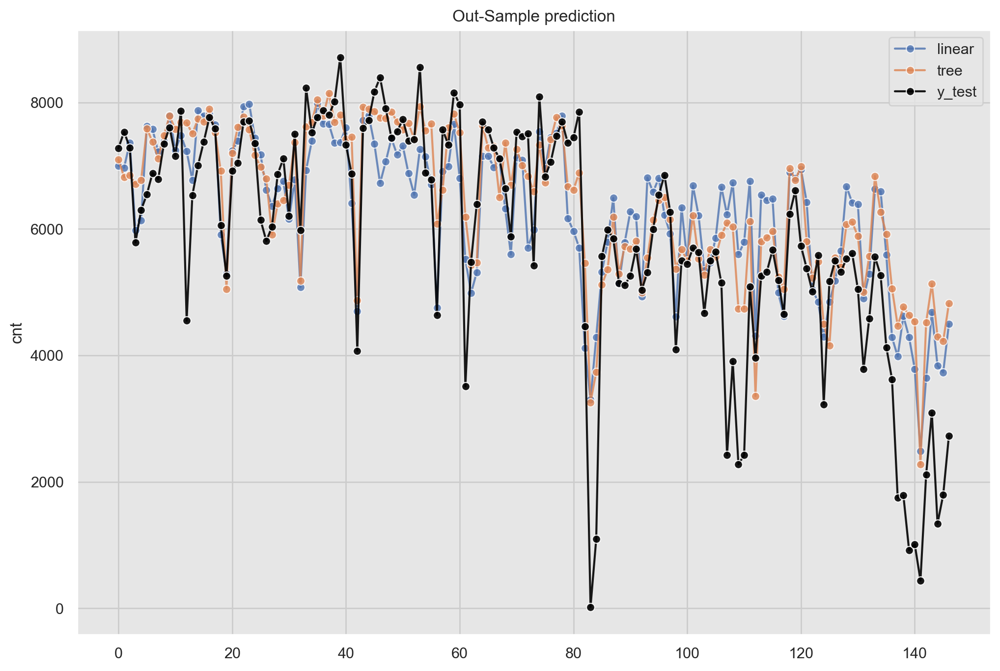

In [80]:
fig, ax = plt.subplots(figsize=(12, 8))

sns.lineplot(
    x=range(y_test_pred_linear.shape[0]),
    y=y_test_pred_linear,
    color=sns_c[0],
    marker="o",
    label="linear",
    alpha=0.8,
    ax=ax
)

sns.lineplot(
    x=range(y_test_pred_tree.shape[0]),
    y=y_test_pred_tree,
    color=sns_c[1],
    marker="o",
    label="tree",
    alpha=0.8,
    ax=ax
)

sns.lineplot(
    x=range(y_test.shape[0]),
    y=y_test, 
    color="black",
    marker="o",
    label="y_test",
    alpha=0.9,
    ax=ax
)
ax.set(title="Out-Sample prediction") ;

### linear, tree 모형의 CV 결과

In [81]:
pd.DataFrame(linear_grid_search.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]].sort_values("rank_test_score")[:5]

,mean_test_score,std_test_score,rank_test_score,params
11,-863.329069,119.852426,1,{'linear_regressor__alpha': 2.976351441631316}
10,-893.155951,144.125917,2,{'linear_regressor__alpha': 1.438449888287663}
12,-929.726821,135.564479,3,{'linear_regressor__alpha': 6.158482110660261}
8,-945.863795,317.103657,4,{'linear_regressor__alpha': 0.3359818286283781}
16,-989.662561,262.903467,5,{'linear_regressor__alpha': 112.88378916846884}


In [82]:
pd.DataFrame(tree_grid_search.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]].sort_values("rank_test_score")[:5]

,mean_test_score,std_test_score,rank_test_score,params
3,-656.488356,115.612512,1,"{'tree_regressor__max_depth': 3, 'tree_regress..."
0,-673.071684,153.414280,2,"{'tree_regressor__max_depth': 3, 'tree_regress..."
1,-673.071684,153.414280,2,"{'tree_regressor__max_depth': 3, 'tree_regress..."
2,-673.071684,153.414280,2,"{'tree_regressor__max_depth': 3, 'tree_regress..."
7,-718.975934,101.126734,5,"{'tree_regressor__max_depth': 5, 'tree_regress..."


## 2. Model Interpretation
- 모델은 어떻게 예측값을 만들었나?
- 중요한 feature는 어떤 것인가?
- 중요한 feature간에 상호작용은 없을까?
- 최종 반환값에 특정 기능이 미치는 영향은 무엇일까?

### 모델별 구체적 예측 방법

#### Linear
- linear model은 해석이 용이한 모델이다.
   - w_0 + w_1x_1 + ... + w_nx_n + epsilon
   - w_0 : intercept
   - epsilon : 정규분포를 따르는 잔차
      - 상관관계가 높거나 다중공선성이 있는 경우 해석의 주의가 필요하다

In [83]:
# list 타입의 bool 인덱싱 기능

from itertools import compress

### 다항차수 feature
- OneHotEncoder()로 전처리 된 features를 PolynomialFeatures()로 상호작용을 적용한 features

In [84]:
# features_ext : one hot encoder로 변환한 cat features와 numeric features를 합한 것

polynomial_features = linear_grid_search\
    .best_estimator_["linear_feature_engineering"]["polynomial"]\
    .get_feature_names_out(features_ext)

polynomial_features

array(['season_FALL', 'season_SPRING', 'season_SUMMER', 'season_WINTER',
       'mnth_APR', 'mnth_AUG', 'mnth_DEC', 'mnth_FEB', 'mnth_JAN',
       'mnth_JUL', 'mnth_JUN', 'mnth_MAR', 'mnth_MAY', 'mnth_NOV',
       'mnth_OCT', 'mnth_SEP', 'holiday_HOLIDAY', 'holiday_NO HOLIDAY',
       'weekday_FRI', 'weekday_MON', 'weekday_SAT', 'weekday_SUN',
       'weekday_THU', 'weekday_TUE', 'weekday_WED',
       'workingday_NO WORKING DAY', 'workingday_WORKING DAY',
       'weathersit_GOOD', 'weathersit_MISTY',
       'weathersit_RAIN/SNOW/STORM', 'temp', 'hum', 'windspeed',
       'days_since_2011', 'yr', 'season_FALL season_SPRING',
       'season_FALL season_SUMMER', 'season_FALL season_WINTER',
       'season_FALL mnth_APR', 'season_FALL mnth_AUG',
       'season_FALL mnth_DEC', 'season_FALL mnth_FEB',
       'season_FALL mnth_JAN', 'season_FALL mnth_JUL',
       'season_FALL mnth_JUN', 'season_FALL mnth_MAR',
       'season_FALL mnth_MAY', 'season_FALL mnth_NOV',
       'season_FALL mnth_OCT

In [85]:
# 상호작용을 거친 features의 갯수

len(polynomial_features)

630

In [86]:
# 모형의 fitting 후 반환된 coef의 수 : 변수선택을 거치면서 features의 갯수가 줄어든다.

len(linear_grid_search.best_estimator_["linear_regressor"].coef_)

485

### 변수선택의 반환값
- PolynomialFeatures() 상호작용 조합 후, VarinaceThreshold() 변수선택의 결과
   - feature의 분산이 threshold 값보다 작으면 제거된다.

In [87]:
variance_threshold_support = linear_grid_search\
    .best_estimator_["linear_feature_engineering"]["varinace_threshold"]\
    .get_support()

variance_threshold_support

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
       False, False, False, False,  True, False, False, False, False,
       False, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False, False,  True,
       False, False, False, False, False,  True,  True,  True, False,
       False, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False,  True, False, False, False,
        True,  True, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [88]:
# thr 값

linear_grid_search.best_estimator_["linear_feature_engineering"]["varinace_threshold"].threshold

0.0

### polynomial features에서 변수선택을 거친 최종 features
- compress() : list 타입에서 bool 데이터로 만들어진 list로 인덱싱 해준다.
   - list에서 list-bool 로 인덱싱이 안된다.
   - array로 변환한 후 인덱싱이 가능하지만, array로 반환된다.

In [89]:
linear_features = list(
    compress(data=polynomial_features, selectors=variance_threshold_support)
)

linear_features

['season_FALL',
 'season_SPRING',
 'season_SUMMER',
 'season_WINTER',
 'mnth_APR',
 'mnth_AUG',
 'mnth_DEC',
 'mnth_FEB',
 'mnth_JAN',
 'mnth_JUL',
 'mnth_JUN',
 'mnth_MAR',
 'mnth_MAY',
 'mnth_NOV',
 'mnth_OCT',
 'mnth_SEP',
 'holiday_HOLIDAY',
 'holiday_NO HOLIDAY',
 'weekday_FRI',
 'weekday_MON',
 'weekday_SAT',
 'weekday_SUN',
 'weekday_THU',
 'weekday_TUE',
 'weekday_WED',
 'workingday_NO WORKING DAY',
 'workingday_WORKING DAY',
 'weathersit_GOOD',
 'weathersit_MISTY',
 'weathersit_RAIN/SNOW/STORM',
 'temp',
 'hum',
 'windspeed',
 'days_since_2011',
 'yr',
 'season_FALL mnth_DEC',
 'season_FALL mnth_NOV',
 'season_FALL mnth_OCT',
 'season_FALL mnth_SEP',
 'season_FALL holiday_HOLIDAY',
 'season_FALL holiday_NO HOLIDAY',
 'season_FALL weekday_FRI',
 'season_FALL weekday_MON',
 'season_FALL weekday_SAT',
 'season_FALL weekday_SUN',
 'season_FALL weekday_THU',
 'season_FALL weekday_TUE',
 'season_FALL weekday_WED',
 'season_FALL workingday_NO WORKING DAY',
 'season_FALL workingday_WO

In [90]:
print(f'''
------------------------------------------
* 전처리기를 거친후 features의 갯수 : {len(features_ext)}
* 상호작용이 적용된 features의 갯수 : {len(polynomial_features)}
* 변수선택이 적용된 features의 갯수 : {len(linear_features)}
* Lasso model fitting 후  coef 갯수 : {len(linear_grid_search.best_estimator_["linear_regressor"].coef_)}
------------------------------------------
''')


------------------------------------------
* 전처리기를 거친후 features의 갯수 : 35
* 상호작용이 적용된 features의 갯수 : 630
* 변수선택이 적용된 features의 갯수 : 485
* Lasso model fitting 후  coef 갯수 : 485
------------------------------------------



### compress() 테스트

In [91]:
temp_1 = [1, 2, 3, 4]
temp_2 = [True, False, True, False]

list(compress(data=temp_1, selectors=temp_2))

[1, 3]

In [92]:
temp_1[temp_2]

TypeError: list indices must be integers or slices, not list

In [93]:
np.array(temp_1)[temp_2]

array([1, 3])

### linear_feature_engineering의 각 steps를 적용한 X_train
- X_train의 pipeline 전처리 과정 : 
   - ColumnTransformer() -> num, cat transformer -> PolynomialFeatures() -> VarianceThreshold()

In [94]:
linear_X_train = pd.DataFrame(data=linear_grid_search\
                              .best_estimator_["linear_feature_engineering"]\
                              .transform(X_train), columns=linear_features
)

linear_X_train.head()

,season_FALL,season_SPRING,season_SUMMER,season_WINTER,mnth_APR,mnth_AUG,mnth_DEC,mnth_FEB,mnth_JAN,mnth_JUL,...,temp hum,temp windspeed,temp days_since_2011,temp yr,hum windspeed,hum days_since_2011,hum yr,windspeed days_since_2011,windspeed yr,days_since_2011 yr
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-1.006037,0.362071,1.407229,0.630410,-0.549936,-2.137386,-0.957506,0.769242,0.344605,1.339345
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.351027,-0.506703,1.225534,0.550905,0.351635,-0.850480,-0.382310,-1.227659,-0.551860,1.334751
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,2.011569,-1.134697,2.746627,1.238935,-0.892215,2.159679,0.974177,-1.218244,-0.549519,1.330156
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.349707,0.706088,2.704067,1.223965,0.098895,0.378735,0.171430,0.764698,0.346131,1.325561
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.810137,0.139864,2.450348,1.112979,0.122630,2.148405,0.975833,0.166001,0.075400,1.320967


### StandardScaler()

In [99]:
linear_X_train[numeric_features].describe()

,temp,hum,windspeed,days_since_2011,yr
count,584.000000,584.000000,5.840000e+02,584.000000,5.840000e+02
mean,0.000000,0.000000,-1.460019e-16,0.000000,-4.866731e-17
std,1.000857,1.000857,1.000857e+00,1.000857,1.000857e+00
min,-2.328881,-4.216383,-2.258586e+00,-1.729088,-7.745967e-01
25%,-0.859260,-0.787156,-7.164670e-01,-0.864544,-7.745967e-01
50%,0.027714,-0.006867,-1.058016e-01,0.000000,-7.745967e-01
75%,0.865964,0.725140,5.255588e-01,0.864544,1.290994e+00
max,1.936756,2.363856,4.114089e+00,1.729088,1.290994e+00


### VarinanceThreshold()의 thr=0보다 분산값이 작은 것은 제거 됨

In [101]:
sum(linear_X_train.var(axis=0) < 0.0)

0

### 조건수 확인
- 회귀분석에서 조건수가 커지는 조건
   - 스케일 차이 : 스케일링 적용
   - 다중공선성이 있는 경우 : 상관관계가 큰 독립변수가 있는 경우 : 변수선택, PCA 적용

In [102]:
np.linalg.cond(linear_X_train)

1.0517515611708736e+32

### GridSearchCV()의 step 별 전처리기 사용

In [103]:
X_train.tail()

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,days_since_2011,yr
579,SUMMER,AUG,NO HOLIDAY,THU,WORKING DAY,GOOD,27.367500,65.9583,8.666718,579,2012
580,SUMMER,AUG,NO HOLIDAY,FRI,WORKING DAY,MISTY,27.994151,64.2500,14.458064,580,2012
581,SUMMER,AUG,NO HOLIDAY,SAT,NO WORKING DAY,GOOD,29.286651,61.3333,17.249686,581,2012
582,SUMMER,AUG,NO HOLIDAY,SUN,NO WORKING DAY,GOOD,28.150849,65.2500,19.458207,582,2012
583,SUMMER,AUG,NO HOLIDAY,MON,WORKING DAY,MISTY,27.367500,65.4167,8.666718,583,2012


In [104]:
prepro_X_train = linear_grid_search\
    .best_estimator_["linear_feature_engineering"]["linear_preprocessing"]\
    .transform(X_train)
prepro_X_train

array([[ 0.        ,  0.        ,  0.        , ..., -0.44488315,
        -1.7290875 , -0.77459667],
       [ 0.        ,  0.        ,  0.        , ...,  0.71244778,
        -1.72315581, -0.77459667],
       [ 0.        ,  0.        ,  0.        , ...,  0.70942613,
        -1.71722412, -0.77459667],
       ...,
       [ 0.        ,  0.        ,  1.        , ...,  0.82962207,
         1.71722412,  1.29099445],
       [ 0.        ,  0.        ,  1.        , ...,  1.2626769 ,
         1.72315581,  1.29099445],
       [ 0.        ,  0.        ,  1.        , ..., -0.85335752,
         1.7290875 ,  1.29099445]])

In [105]:
prepro_X_train.shape

(584, 35)

In [106]:
prepro_2_X_train = linear_grid_search\
    .best_estimator_["linear_feature_engineering"]["polynomial"]\
    .transform(prepro_X_train)
prepro_2_X_train

array([[ 0.        ,  0.        ,  0.        , ...,  0.76924189,
         0.344605  ,  1.33934542],
       [ 0.        ,  0.        ,  0.        , ..., -1.22765853,
        -0.55185968,  1.33475075],
       [ 0.        ,  0.        ,  0.        , ..., -1.21824366,
        -0.54951912,  1.33015609],
       ...,
       [ 0.        ,  0.        ,  1.        , ...,  1.42464703,
         1.07103748,  2.21692681],
       [ 0.        ,  0.        ,  1.        , ...,  2.17578904,
         1.63010887,  2.22458459],
       [ 0.        ,  0.        ,  1.        , ..., -1.47552983,
        -1.10167983,  2.23224237]])

In [107]:
prepro_2_X_train.shape

(584, 630)

### coef 확인

In [108]:
linear_model_coef_df = pd.DataFrame(
    data={"linear_features": linear_features, 
          "coef_": linear_grid_search.best_estimator_["linear_regressor"].coef_
})

linear_model_coef_df

,linear_features,coef_
0,season_FALL,0.000000
1,season_SPRING,-0.000000
2,season_SUMMER,508.974043
3,season_WINTER,-645.437011
4,mnth_APR,-0.000000
...,...,...
480,hum days_since_2011,-59.708525
481,hum yr,6.874994
482,windspeed days_since_2011,-8.387308
483,windspeed yr,-61.166374


In [109]:
# .assign() : 새로운 컬럼 생성

linear_model_coef_df = linear_model_coef_df\
    .assign(abs_coef_=lambda x: x["coef_"].abs())\
    .sort_values("abs_coef_", ascending=False)\
    .reset_index(drop=True)

linear_model_coef_df

,linear_features,coef_,abs_coef_
0,weathersit_RAIN/SNOW/STORM,-1392.098957,1392.098957
1,mnth_JUL,983.547361,983.547361
2,mnth_JUL temp,-925.255563,925.255563
3,season_SUMMER temp,-833.410963,833.410963
4,season_WINTER,-645.437011,645.437011
...,...,...,...
480,mnth_DEC days_since_2011,-0.000000,0.000000
481,mnth_DEC windspeed,-0.000000,0.000000
482,mnth_DEC hum,0.000000,0.000000
483,mnth_DEC weathersit_RAIN/SNOW/STORM,-0.000000,0.000000


### linear_features와 가중치, 절대값 가중치 데이터 프레임
- 어떤 feature가 target에 영향을 미치는지 수치적으로 파악 할 수 있다.
   - OLS 에서는 이 수치에 대한 z통계값과 p-value값을 비교하여 유의미한지 파악할 수 있다.
   - 그러나 현재 모델링에서 변수선택법을 적용한 것이므로 p-value값의 확인이 없어도 되는지?
- weathersit_RAIN/SNOW/STORM feature의 가중치 절대값이 가장크다는 것은 날씨가 좋지 않은 날 자전거 대여수의 감소요인으로 작동한다는 것을 의미한다.
- mnth_JUL과 temp는 각각 높은 양의 가중치인데, 이 둘의 상호작용인 mnth_JUL temp는 음의 가중치값이 크다. 
   - 이것은 mnth JUL이 temp(온도)의 영향을 감소시키는 다는 것을 의미한다. 
   - "가중치 효과"에 따른 현상
   - season_SUMMER와 temp도 같은현상

In [110]:
linear_model_coef_df\
    .head(20)\
    .style.background_gradient(
        cmap="viridis_r",
        axis=0,
        subset=["abs_coef_"]
)

,linear_features,coef_,abs_coef_
0,weathersit_RAIN/SNOW/STORM,-1392.098957,1392.098957
1,mnth_JUL,983.547361,983.547361
2,mnth_JUL temp,-925.255563,925.255563
3,season_SUMMER temp,-833.410963,833.410963
4,season_WINTER,-645.437011,645.437011
5,mnth_APR temp,554.073583,554.073583
6,mnth_JUN temp,-522.243657,522.243657
7,season_SUMMER,508.974043,508.974043
8,season_WINTER mnth_MAR,483.987658,483.987658
9,temp,438.628918,438.628918


### 가중치 효과 그래프
- coef_ * X_train
   - (485 x 485) * (485 x 584)
   - transform 된 X_train 데이터 세트에 coef 벡터를 곱한 결과

In [120]:
linear_model_effects = np.multiply(
    linear_grid_search.best_estimator_["linear_regressor"].coef_,
    linear_grid_search.best_estimator_["linear_feature_engineering"].transform(X_train)
)

linear_model_effects

array([[  0.        ,  -0.        ,   0.        , ...,  -6.45186848,
        -21.07823861, 466.76280239],
       [  0.        ,  -0.        ,   0.        , ...,  10.29674993,
         33.7552554 , 465.16155778],
       [  0.        ,  -0.        ,   0.        , ...,  10.21778454,
         33.61209188, 463.56031318],
       ...,
       [  0.        ,  -0.        , 508.97404281, ..., -11.94895306,
        -65.51147929, 772.60052196],
       [  0.        ,  -0.        , 508.97404281, ..., -18.24901228,
        -99.70784871, 775.26926297],
       [  0.        ,  -0.        , 508.97404281, ...,  12.37572278,
         67.3857603 , 777.93800398]])

In [121]:
linear_grid_search.best_estimator_["linear_regressor"].coef_.shape

(485,)

In [122]:
linear_grid_search.best_estimator_["linear_feature_engineering"].transform(X_train).shape

(584, 485)

In [123]:
linear_model_effects.shape

(584, 485)

In [124]:
np.multiply([[1, 2], [3, 4]], [[1, 2], [3, 4]])

array([[ 1,  4],
       [ 9, 16]])

In [125]:
linear_model_effects_df = pd.DataFrame(
    data=linear_model_effects,
    columns=linear_features
)

linear_model_effects_df

,season_FALL,season_SPRING,season_SUMMER,season_WINTER,mnth_APR,mnth_AUG,mnth_DEC,mnth_FEB,mnth_JAN,mnth_JUL,...,temp hum,temp windspeed,temp days_since_2011,temp yr,hum windspeed,hum days_since_2011,hum yr,windspeed days_since_2011,windspeed yr,days_since_2011 yr
0,0.0,-0.0,0.000000,-645.437011,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,0.0,-0.0,7.258380,0.0,20.129752,127.620165,-6.582850,-6.451868,-21.078239,466.762802
1,0.0,-0.0,0.000000,-645.437011,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,0.0,0.0,6.321211,0.0,-12.871200,50.780904,-2.628376,10.296750,33.755255,465.161558
2,0.0,-0.0,0.000000,-645.437011,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,0.0,14.166898,0.0,32.658470,-128.951230,6.697460,10.217785,33.612092,463.560313
3,0.0,-0.0,0.000000,-645.437011,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,-0.0,13.947377,0.0,-3.619950,-22.613681,1.178579,-6.413753,-21.171606,461.959069
4,0.0,-0.0,0.000000,-645.437011,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,-0.0,12.638709,0.0,-4.488716,-128.278092,6.708847,-1.392306,-4.611944,460.357824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0.0,-0.0,508.974043,-0.000000,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,0.0,11.932048,0.0,7.701649,-25.106076,2.188381,12.205902,67.385760,767.263040
580,0.0,-0.0,508.974043,-0.000000,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,-0.0,12.599078,0.0,-1.353047,-13.382671,1.162462,-4.050895,-22.286472,769.931781
581,0.0,-0.0,508.974043,-0.000000,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,0.0,-0.0,13.937402,0.0,2.015781,6.806125,-0.589160,-11.948953,-65.511479,772.600522
582,0.0,-0.0,508.974043,-0.000000,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,-0.0,12.843921,0.0,-9.180731,-20.437107,1.763012,-18.249012,-99.707849,775.269263


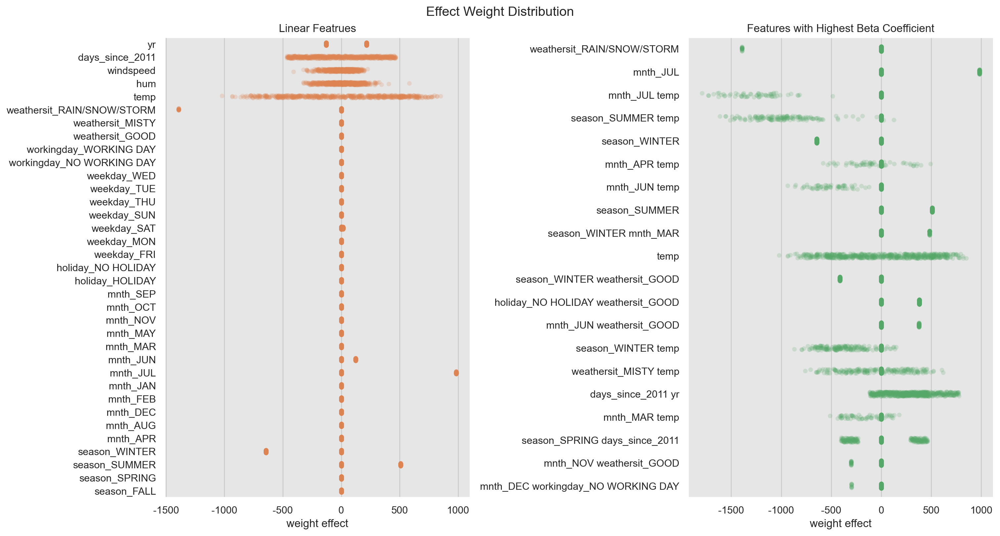

In [115]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 8), constrained_layout=True)

# 가중치 효과에 대한 분포도 : feature_ext (상호작용 전 features)
sns.stripplot(
    data=linear_model_effects_df[features_ext[::-1]],
    orient="h",
    color=sns_c[1],
    alpha=0.2,
    ax=ax[0]
)
ax[0].set(title="Linear Featrues", xlabel="weight effect")

# 가중치 효과에 대한 분포도 : 상호작용이 적용된 features 중 effect 상위 20개
sns.stripplot(
    data=linear_model_effects_df[linear_model_coef_df.head(20)["linear_features"]],
    orient="h",
    color=sns_c[2],
    alpha=0.2,
    ax=ax[1]
)
ax[1].set(title="Features with Highest Beta Coefficient", xlabel="weight effect")
fig.suptitle("Effect Weight Distribution") ;

In [126]:
linear_model_coef_df.head(20)["linear_features"]

0             weathersit_RAIN/SNOW/STORM
1                               mnth_JUL
2                          mnth_JUL temp
3                     season_SUMMER temp
4                          season_WINTER
5                          mnth_APR temp
6                          mnth_JUN temp
7                          season_SUMMER
8                 season_WINTER mnth_MAR
9                                   temp
10         season_WINTER weathersit_GOOD
11    holiday_NO HOLIDAY weathersit_GOOD
12              mnth_JUN weathersit_GOOD
13                    season_WINTER temp
14                 weathersit_MISTY temp
15                    days_since_2011 yr
16                         mnth_MAR temp
17         season_SPRING days_since_2011
18              mnth_NOV weathersit_GOOD
19    mnth_DEC workingday_NO WORKING DAY
Name: linear_features, dtype: object

In [127]:
features_ext[::-1]

['yr',
 'days_since_2011',
 'windspeed',
 'hum',
 'temp',
 'weathersit_RAIN/SNOW/STORM',
 'weathersit_MISTY',
 'weathersit_GOOD',
 'workingday_WORKING DAY',
 'workingday_NO WORKING DAY',
 'weekday_WED',
 'weekday_TUE',
 'weekday_THU',
 'weekday_SUN',
 'weekday_SAT',
 'weekday_MON',
 'weekday_FRI',
 'holiday_NO HOLIDAY',
 'holiday_HOLIDAY',
 'mnth_SEP',
 'mnth_OCT',
 'mnth_NOV',
 'mnth_MAY',
 'mnth_MAR',
 'mnth_JUN',
 'mnth_JUL',
 'mnth_JAN',
 'mnth_FEB',
 'mnth_DEC',
 'mnth_AUG',
 'mnth_APR',
 'season_WINTER',
 'season_SUMMER',
 'season_SPRING',
 'season_FALL']

### 가중치 효과 평균 그래프 2
- coef_ * (transformer) X_train 값으로 이루어진 df에서 각 feature 별 평균값을 계산
- 가장 높은 효과를 가진 features를 토대로 데이터의 상관관계를 설명할 수 있다.
   - 통계값을 적용하여 신뢰도를 구한 것은 아닌 상태
- temp의 값에 따라서 target 값이 크게 변화한다.
- days_since_2011과 yr의 상호작용 feature 값에 따라서 target값이 크게 변화한다.

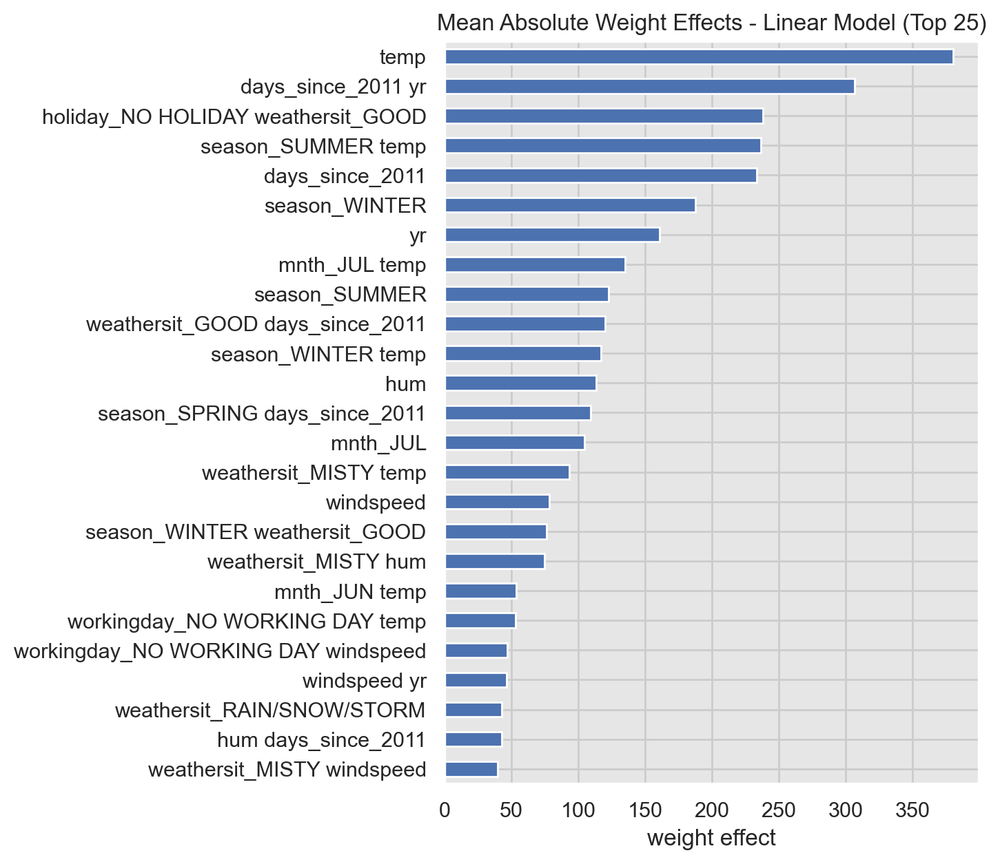

In [128]:
fig, ax = plt.subplots(figsize=(5, 7))

linear_model_effects_df\
    .abs()\
    .mean(axis=0)\
    .sort_values()\
    .tail(25)\
    .plot(kind="barh", ax=ax)

ax.set(title=("Mean Absolute Weight Effects - Linear Model (Top 25)"),
       xlabel="weight effect"
) ;

In [129]:
linear_model_effects_df.abs().mean(axis=0).sort_values().tail(25)

weathersit_MISTY windspeed              39.609137
hum days_since_2011                     42.674338
weathersit_RAIN/SNOW/STORM              42.907160
windspeed yr                            46.230670
workingday_NO WORKING DAY windspeed     46.975110
workingday_NO WORKING DAY temp          53.206328
mnth_JUN temp                           53.276266
weathersit_MISTY hum                    74.798111
season_WINTER weathersit_GOOD           76.403001
windspeed                               78.378022
weathersit_MISTY temp                   93.001541
mnth_JUL                               104.417699
season_SPRING days_since_2011          109.307442
hum                                    113.233824
season_WINTER temp                     116.727497
weathersit_GOOD days_since_2011        119.964757
season_SUMMER                          122.885856
mnth_JUL temp                          134.799969
yr                                     161.016065
season_WINTER                          187.884061


### 개별 feature temp의 가중치 효과 그래프
- 온도 feature의 가중치 효과 그래프
- 상호작용이 적용되지 않은 순수 온도 값에 대한 가중치 효과 그래프

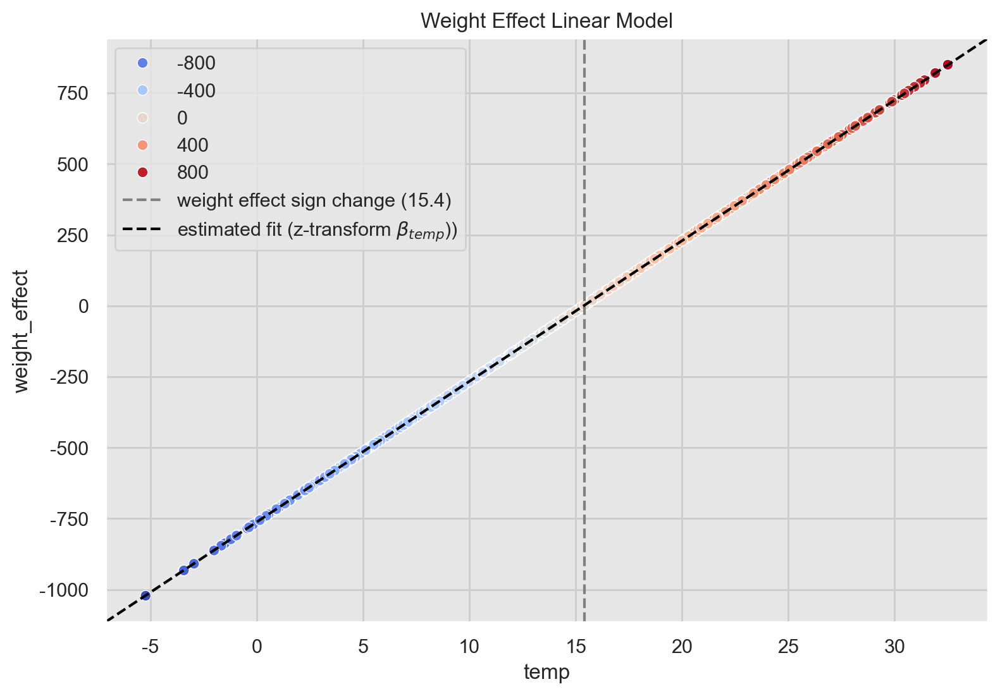

In [130]:
fig, ax = plt.subplots(figsize=(9, 6))

sns.scatterplot(
    x=X_train["temp"],
    y=linear_model_effects_df["temp"],
    hue=linear_model_effects_df["temp"].rename("weight_effect"),
    palette="coolwarm",
    ax=ax
)

# 가중치 효과의 부호가 바뀌는 지점
cp = X_train["temp"].iloc[linear_model_effects_df["temp"].abs().argmin()]
ax.axvline(
    x=cp,
    color="gray",
    linestyle="--",
    label=f"weight effect sign change ({cp:0.1f})"
)

beta_temp = linear_model_coef_df.query('linear_features=="temp"')["coef_"].values[0]
ax.axline(
    xy1=(X_train["temp"].mean(), 0),
    slope=beta_temp / X_train["temp"].std(),
    color="black",
    linestyle="--",
    label=r"estimated fit (z-transform $\beta_{temp}$))"
)

ax.legend() 
ax.set(title="Weight Effect Linear Model", xlabel="temp", ylabel="weight_effect");

In [149]:
real_temp = X_train["temp"][0]
transform_temp = linear_X_train["temp"][0]
coef_temp = linear_model_coef_df.query("linear_features == 'temp'")["coef_"].values[0]
multip_temp_coef = transform_temp * coef_temp

print(f'''
실제 temp : {real_temp}, 
전처리 후 temp : {transform_temp}, 
temp의 coef : {coef_temp}, 
coef effect temp : 전처리 temp * coef = {multip_temp_coef}
''')


실제 temp : 8.175849, 
전처리 후 temp : -0.8138563421371907, 
temp의 coef : 438.6289176201695, 
coef effect temp : 전처리 temp * coef = -356.9809264499463



In [150]:
linear_model_effects_df["temp"][0]

-356.9809264499463

### 2개 feature의 상호작용 조합의 가중치 효과 그래프 1
- temp와 hum

In [152]:
import matplotlib.cm as cm

In [153]:
help(cm)

Help on module matplotlib.cm in matplotlib:

NAME
    matplotlib.cm - Builtin colormaps, colormap handling utilities, and the `ScalarMappable` mixin.

DESCRIPTION
    .. seealso::
    
      :doc:`/gallery/color/colormap_reference` for a list of builtin colormaps.
    
      :ref:`colormap-manipulation` for examples of how to make
      colormaps.
    
      :ref:`colormaps` an in-depth discussion of choosing
      colormaps.
    
      :ref:`colormapnorms` for more details about data normalization.

CLASSES
    builtins.object
        ScalarMappable
    collections.abc.Mapping(collections.abc.Collection)
        ColormapRegistry
    
    class ColormapRegistry(collections.abc.Mapping)
     |  ColormapRegistry(cmaps)
     |  
     |  Container for colormaps that are known to Matplotlib by name.
     |  
     |  The universal registry instance is `matplotlib.colormaps`. There should be
     |  no need for users to instantiate `.ColormapRegistry` themselves.
     |  
     |  Read access 

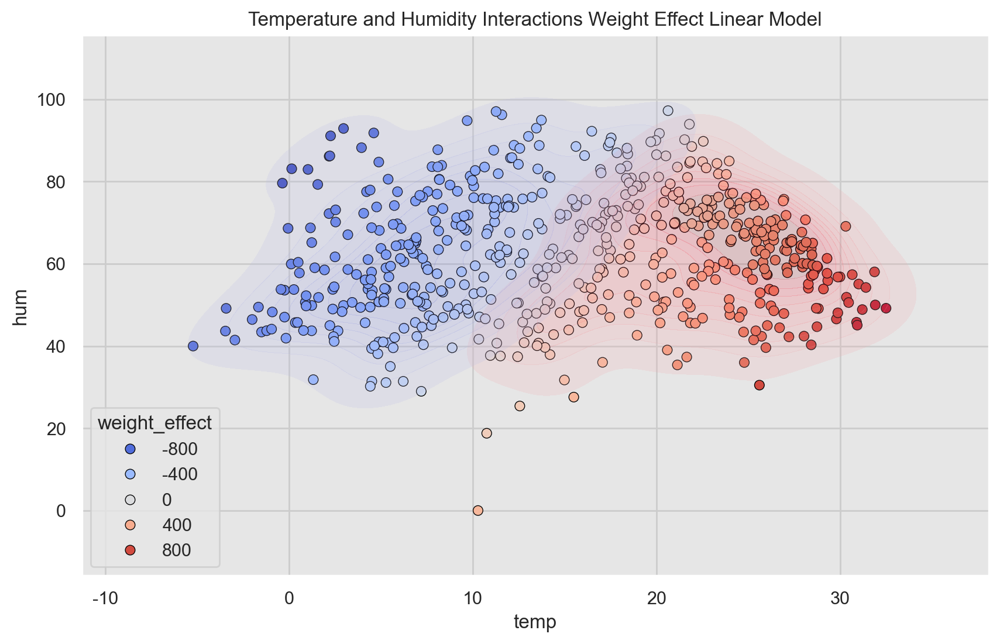

In [154]:
# linear_model_effects : coef_ * transform X_train

fig, ax = plt.subplots()

# Data Density
sns.scatterplot(
    x=X_train["temp"],
    y=X_train["hum"],
    hue=(linear_model_effects_df["temp"] \
        + linear_model_effects_df["hum"] \
        + linear_model_effects_df["temp hum"]
    ),
    palette="coolwarm",
    edgecolor="black",
    ax=ax
)

# interaction of 2 feature : temp, hum, temp hume
sns.kdeplot(
    x=X_train["temp"],
    y=X_train["hum"],
    levels=10,
    hue=(linear_model_effects_df["temp"] \
        + linear_model_effects_df["hum"] \
        + linear_model_effects_df["temp hum"]
    ) > 0,
    hue_order=[True, False],
    palette=[cm.get_cmap("coolwarm_r")(1),
             cm.get_cmap("coolwarm")(1)
    ],
    alpha=0.2,
    fill=True,
    ax=ax
)

ax.legend(title="weight_effect", loc="lower left")
ax.set(title="Temperature and Humidity Interactions Weight Effect Linear Model") ; 

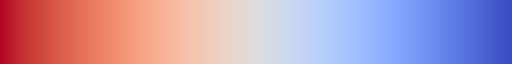

In [155]:
cm.get_cmap("coolwarm_r")

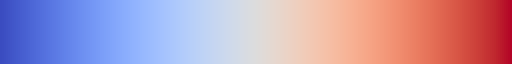

In [156]:
cm.get_cmap("coolwarm")

In [157]:
(linear_model_effects_df["temp"] \
+ linear_model_effects_df["hum"] \
+ linear_model_effects_df["temp hum"]) > 0

0      False
1      False
2      False
3      False
4      False
       ...  
579     True
580     True
581     True
582     True
583     True
Length: 584, dtype: bool

### 2개 feature의 상호작용 조합의 가중치 효과 그래프 2
- hum과 windspeed

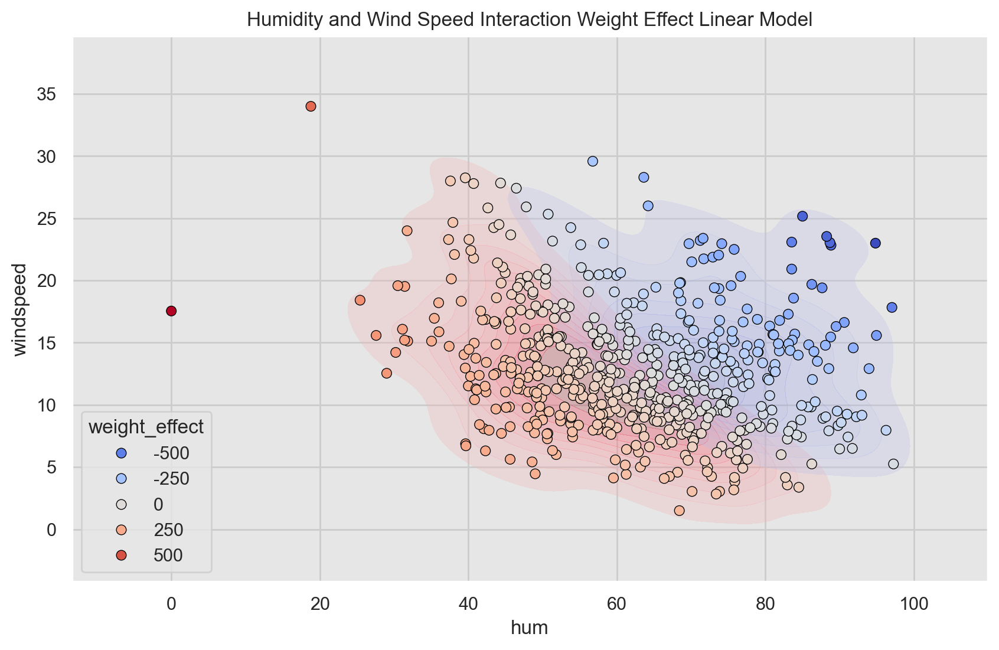

In [158]:
fig, ax = plt.subplots()

sns.kdeplot(
    x=X_train["hum"],
    y=X_train["windspeed"],
    hue=(linear_model_effects_df["hum"] \
        + linear_model_effects_df["windspeed"] \
        + linear_model_effects_df["hum windspeed"]
    ) > 0,
    palette=[
        cm.get_cmap("coolwarm_r")(1),
        cm.get_cmap("coolwarm")(1)
    ],
    hue_order=[True, False],
    levels=10,
    alpha=0.3,
    fill=True,
    ax=ax
)

sns.scatterplot(
    x=X_train["hum"],
    y=X_train["windspeed"],
    hue=(linear_model_effects_df["hum"] \
        + linear_model_effects_df["windspeed"] \
        + linear_model_effects_df["hum windspeed"]
    ),
    palette="coolwarm",
    edgecolor="black",
    ax=ax
)

ax.legend(title="weight_effect", loc="lower left")
ax.set(title="Humidity and Wind Speed Interaction Weight Effect Linear Model") ;

### feature가 개별 예측에 끼친 영향
- obs_index 인 284 개별 샘플 데이터에 대한 coef effects

In [159]:
obs_index = (285 - 1)
X_train_obs = X_train.iloc[obs_index, :]
X_train_obs

season                        FALL
mnth                           OCT
holiday                 NO HOLIDAY
weekday                        WED
workingday             WORKING DAY
weathersit         RAIN/SNOW/STORM
temp                     17.536651
hum                         90.625
windspeed                 16.62605
days_since_2011                284
yr                            2011
Name: 284, dtype: object

In [160]:
print(f"target for observation {obs_index} = \
{y_train[obs_index]:.2f}")

print(f"prediction for observation {obs_index} = \
{y_train_pred_linear[obs_index]:.2f}")

target for observation 284 = 2416.00
prediction for observation 284 = 2274.26


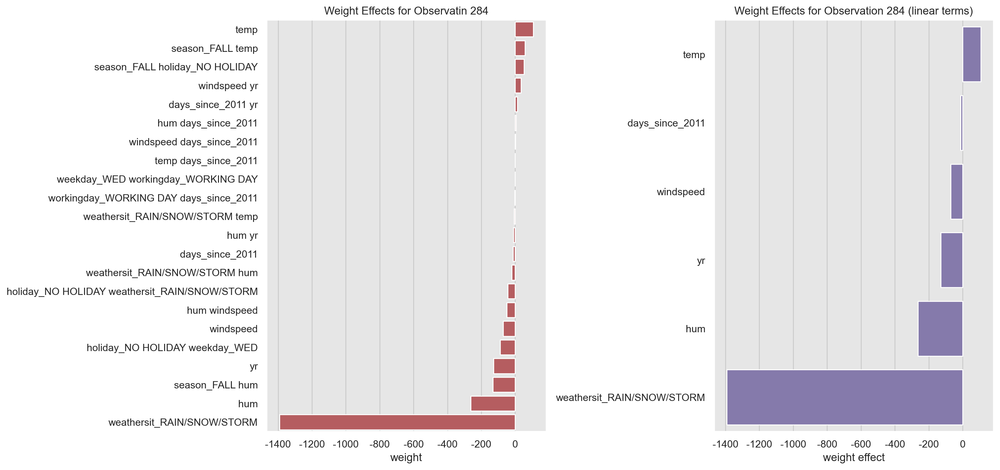

In [161]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), constrained_layout=True)

# obs_index 샘플의 all features(상호작용 포함)의 coef effect 값 중 0이 아닌 것
linear_model_effects_df.iloc[obs_index] \
    .to_frame() \
    .rename(columns={obs_index: "effect"}) \
    .query("effect != 0") \
    .reset_index(drop=False) \
    .sort_values("effect", ascending=False) \
    .pipe((sns.barplot, "data"),
         x="effect",
         y="index",
         color=sns_c[3],
         ax=ax[0]
)
ax[0].set(
    title=f"Weight Effects for Observatin {obs_index}",
    xlabel="weight",
    ylabel=""
)

# obs_index 샘플 데이터의 features 중 feature_ext(상호작용이 없는)에 속하면서 
# coef effect 값이 0이 아닌 features
linear_model_effects_df.iloc[obs_index] \
    .to_frame() \
    .rename(columns={obs_index: "effect"}) \
    .query("effect != 0 and index in @features_ext") \
    .reset_index(drop=False) \
    .sort_values("effect", ascending=False) \
    .pipe((sns.barplot, "data"),
         x="effect",
         y="index",
         color=sns_c[4],
         ax=ax[1]
)
ax[1].set(
    title=f"Weight Effects for Observation {obs_index} (linear terms)",
    xlabel="weight effect",
    ylabel=""
);

In [162]:
linear_model_effects_df.iloc[obs_index]

season_FALL                   0.000000
season_SPRING                -0.000000
season_SUMMER                 0.000000
season_WINTER                -0.000000
mnth_APR                     -0.000000
                               ...    
hum days_since_2011           5.088364
hum yr                      -10.201173
windspeed days_since_2011     0.263930
windspeed yr                 33.513122
days_since_2011 yr           12.009335
Name: 284, Length: 485, dtype: float64

In [163]:
linear_model_effects_df.iloc[obs_index] \
    .to_frame() \
    .rename(columns={obs_index: "effect"}) \
    .query("effect != 0 and index in @features_ext") \
    .reset_index(drop=False) \
    .sort_values("effect", ascending=False)

,index,effect
1,temp,107.354129
4,days_since_2011,-12.004308
3,windspeed,-70.450403
5,yr,-128.812852
2,hum,-263.488380
0,weathersit_RAIN/SNOW/STORM,-1392.098957


### coef effect + intercepth 와 pred 값의 비교
- 두 값은 같다.
- 즉 model의 예측값은 coef * transform X_train + intercept와 같다.

In [164]:
linear_model_intercept = \
    linear_grid_search.best_estimator_["linear_regressor"].intercept_

linear_model_intercept

4226.971803010659

In [165]:
linear_model_effects_df.iloc[obs_index].sum() \
    + linear_model_intercept \
    - y_train_pred_linear[obs_index]

0.0

In [166]:
obs_effect_val = linear_model_effects_df.iloc[obs_index].sum() \
    + linear_model_intercept
obs_effect_val

2274.258073556624

In [167]:
y_train_pred_linear[obs_index]

2274.258073556624

In [168]:
# 실제값

y_train[obs_index]

2416

## XGBR Model
- Tree 계열 ensemble 모형
   - 복잡하고 비선형적인 관계를 학습할 수 있다 

### Tree 모형의 데이터 전처리

In [169]:
tree_grid_search

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=14),
             estimator=Pipeline(steps=[('tree_feature_engineering',
                                        Pipeline(steps=[('tree_preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat',
                                                                                          Pipeline(steps=[('one_hot',
                                                                                                           OneHotEncoder())]),
                                                                                          ['season',
                                                                                           'mnth',
                                                                                           'holiday',
                                                                                           'weekday',
                                                                                           'workingday',
                                                                                           'weathersit'])]))...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=None, ...))]),
             param_grid={'tree_regressor__max_depth': [3, 5, 8, 13],
                         'tree_regressor__min_child_weight': [0.01, 0.5, 1,
                                                              10]},
             scoring='neg_root_mean_squared_error')

In [171]:
# categorical features의 one hot encoding

tree_X_train = pd.DataFrame(
    data=tree_grid_search \
        .best_estimator_["tree_feature_engineering"] \
        .transform(X_train),
    columns=features_ext
)

tree_X_train.shape

(584, 35)

### XGBoost의 여러가지 importance 값을 사용한 그래프
- Gain : feature가 있는 가지(branch)에서 가져온 정확도의 향상
- Cover : feature와 관련된 관측치의 상대적인 양
- Frequency / Weight : Gain을 측정하는 간단한 방법, 생성된 모든 트리에서 기능이 사용된 횟수만 계산
- feature importance : feature의 중요도
- 참고
   - https://xgboost.readthedocs.io/en/latest/R-package/discoverYourData.html
   - https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7

In [172]:
importance_type = [
    "weight",
    "gain",
    "cover",
    "total_gain",
    "total_cover"
]

importance_type

['weight', 'gain', 'cover', 'total_gain', 'total_cover']

### GridSearchCV()에서 반복적으로 반환한 값을 DF로 바로 만들기
- GridSearchCV()에서 반환된 값이 dict 형태이므로
- pd.DataFrame.from_dict()를 사용하여 df를 만들고,
- pd.concat([])을 사용하여 각각의 df를 합한다.

In [173]:
# orient : 방향 : dict data의 key를 index, column으로 설정할 수 있음

tree_feature_importance_df = pd.concat(
    [
        pd.DataFrame.from_dict(
            data=(tree_grid_search \
                  .best_estimator_["tree_regressor"] \
                  .get_booster() \
                  .get_score(importance_type=t)
                 ),
            orient="index",
            columns=[t]
        ) for t in importance_type
    ],
    axis=1
)

tree_feature_importance_df

,weight,gain,cover,total_gain,total_cover
f0,3.0,1.165306e+06,141.000000,3.495916e+06,423.0
f1,5.0,3.762577e+05,82.199997,1.881288e+06,411.0
f2,1.0,1.555266e+05,514.000000,1.555266e+05,514.0
f3,6.0,3.198486e+06,201.333328,1.919092e+07,1208.0
f5,2.0,1.412981e+05,460.000000,2.825961e+05,920.0
f6,3.0,2.302066e+06,370.000000,6.906198e+06,1110.0
f7,1.0,1.500767e+05,569.000000,1.500767e+05,569.0
f8,6.0,1.603888e+05,468.833344,9.623328e+05,2813.0
f9,4.0,8.101066e+05,525.750000,3.240426e+06,2103.0
f10,1.0,1.489270e+06,584.000000,1.489270e+06,584.0


#### dict()로 반환되는 값

In [138]:
tree_grid_search\
    .best_estimator_["tree_regressor"]\
    .get_booster()\
    .get_score(importance_type="gain")

{'f0': 1165305.5,
 'f1': 376257.65625,
 'f2': 155526.5625,
 'f3': 3198486.25,
 'f5': 141298.0625,
 'f6': 2302066.0,
 'f7': 150076.65625,
 'f8': 160388.796875,
 'f9': 810106.625,
 'f10': 1489270.5,
 'f11': 1080972.875,
 'f13': 111135.9375,
 'f14': 215653.28125,
 'f15': 234508.59375,
 'f16': 1156914.375,
 'f18': 810712.5625,
 'f19': 957211.8125,
 'f20': 988750.0,
 'f21': 1232076.625,
 'f22': 356926.96875,
 'f23': 83061.34375,
 'f24': 93489.359375,
 'f25': 1707687.25,
 'f27': 3222604.0,
 'f28': 404508.0625,
 'f29': 11408510.0,
 'f30': 7300344.5,
 'f31': 1483836.125,
 'f32': 1126913.0,
 'f33': 21177220.0}

In [174]:
pd.DataFrame.from_dict(data=tree_grid_search\
                       .best_estimator_["tree_regressor"]\
                       .get_booster()\
                       .get_score(importance_type="gain"),
                      orient="index",
                      columns=["gain"])

,gain
f0,1.165306e+06
f1,3.762577e+05
f2,1.555266e+05
f3,3.198486e+06
f5,1.412981e+05
f6,2.302066e+06
f7,1.500767e+05
f8,1.603888e+05
f9,8.101066e+05
f10,1.489270e+06


In [175]:
# index 정렬 후, index 컬럼을 새로 생성

tree_feature_importance_df = tree_feature_importance_df \
    .reset_index(drop=False) \
    .assign(
        index=lambda x : x["index"].str.replace(pat="f", repl="").astype(int)
    )

tree_feature_importance_df

,index,weight,gain,cover,total_gain,total_cover
0,0,3.0,1.165306e+06,141.000000,3.495916e+06,423.0
1,1,5.0,3.762577e+05,82.199997,1.881288e+06,411.0
2,2,1.0,1.555266e+05,514.000000,1.555266e+05,514.0
3,3,6.0,3.198486e+06,201.333328,1.919092e+07,1208.0
4,5,2.0,1.412981e+05,460.000000,2.825961e+05,920.0
5,6,3.0,2.302066e+06,370.000000,6.906198e+06,1110.0
6,7,1.0,1.500767e+05,569.000000,1.500767e+05,569.0
7,8,6.0,1.603888e+05,468.833344,9.623328e+05,2813.0
8,9,4.0,8.101066e+05,525.750000,3.240426e+06,2103.0
9,10,1.0,1.489270e+06,584.000000,1.489270e+06,584.0


In [176]:
# index 값을 사용하여 features_ext를 인덱싱

tree_features_idx_map = tree_feature_importance_df["index"] \
    .apply(lambda idx : features_ext[idx])

tree_features_idx_map

0                    season_FALL
1                  season_SPRING
2                  season_SUMMER
3                  season_WINTER
4                       mnth_AUG
5                       mnth_DEC
6                       mnth_FEB
7                       mnth_JAN
8                       mnth_JUL
9                       mnth_JUN
10                      mnth_MAR
11                      mnth_NOV
12                      mnth_OCT
13                      mnth_SEP
14               holiday_HOLIDAY
15                   weekday_FRI
16                   weekday_MON
17                   weekday_SAT
18                   weekday_SUN
19                   weekday_THU
20                   weekday_TUE
21                   weekday_WED
22     workingday_NO WORKING DAY
23               weathersit_GOOD
24              weathersit_MISTY
25    weathersit_RAIN/SNOW/STORM
26                          temp
27                           hum
28                     windspeed
29               days_since_2011
Name: inde

### 상대적 feature importance
- mean 값을 통일 시키기

In [178]:
# feature의 각각의 데이터 값을 feature의 총합으로 나누기

tree_feature_importance_rel_df = tree_feature_importance_df / \
                             tree_feature_importance_df.sum(axis=0)

tree_feature_importance_rel_df

,index,weight,gain,cover,total_gain,total_cover
0,0.000000,0.005660,0.017900,0.012620,0.000982,0.002440
1,0.001992,0.009434,0.005780,0.007357,0.000528,0.002370
2,0.003984,0.001887,0.002389,0.046005,0.000044,0.002964
3,0.005976,0.011321,0.049131,0.018020,0.005389,0.006967
4,0.009960,0.003774,0.002170,0.041171,0.000079,0.005306
5,0.011952,0.005660,0.035361,0.033116,0.001939,0.006402
6,0.013944,0.001887,0.002305,0.050927,0.000042,0.003282
7,0.015936,0.011321,0.002464,0.041962,0.000270,0.016223
8,0.017928,0.007547,0.012444,0.047056,0.000910,0.012129
9,0.019920,0.001887,0.022876,0.052270,0.000418,0.003368


In [181]:
tree_feature_importance_df.describe().loc["mean"]

index          1.673333e+01
weight         1.766667e+01
gain           2.170061e+06
cover          3.724266e+02
total_gain     1.186968e+08
total_cover    5.779700e+03
Name: mean, dtype: float64

In [180]:
tree_feature_importance_rel_df.describe().loc["mean"]

index          0.033333
weight         0.033333
gain           0.033333
cover          0.033333
total_gain     0.033333
total_cover    0.033333
Name: mean, dtype: float64

In [182]:
tree_feature_importance_rel_df = tree_feature_importance_rel_df \
    .assign(feature=tree_features_idx_map) \
    .drop("index", axis=1)

tree_feature_importance_rel_df

,weight,gain,cover,total_gain,total_cover,feature
0,0.005660,0.017900,0.012620,0.000982,0.002440,season_FALL
1,0.009434,0.005780,0.007357,0.000528,0.002370,season_SPRING
2,0.001887,0.002389,0.046005,0.000044,0.002964,season_SUMMER
3,0.011321,0.049131,0.018020,0.005389,0.006967,season_WINTER
4,0.003774,0.002170,0.041171,0.000079,0.005306,mnth_AUG
5,0.005660,0.035361,0.033116,0.001939,0.006402,mnth_DEC
6,0.001887,0.002305,0.050927,0.000042,0.003282,mnth_FEB
7,0.011321,0.002464,0.041962,0.000270,0.016223,mnth_JAN
8,0.007547,0.012444,0.047056,0.000910,0.012129,mnth_JUL
9,0.001887,0.022876,0.052270,0.000418,0.003368,mnth_JUN


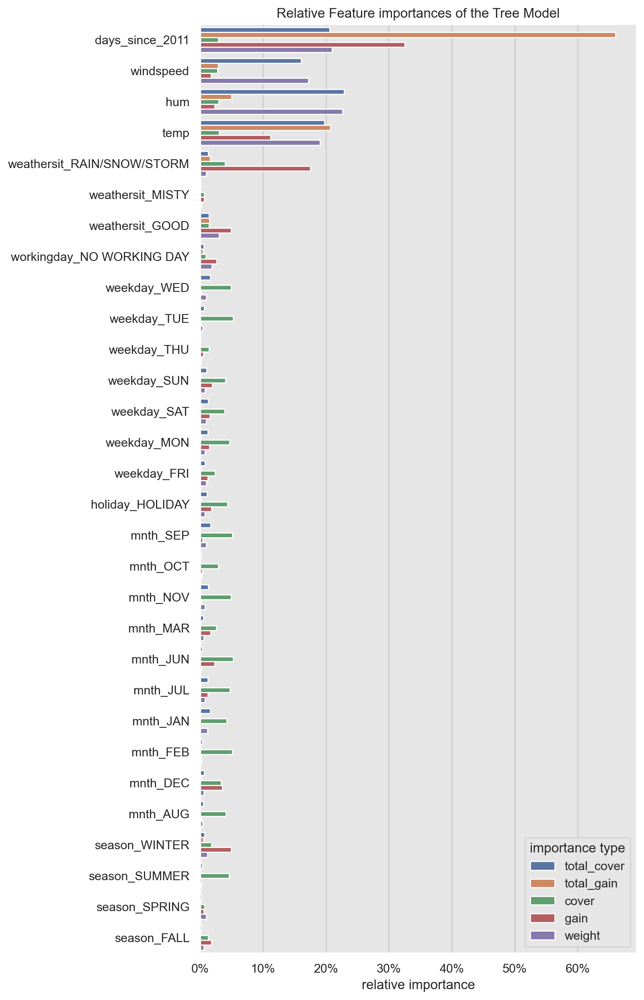

In [183]:
fig, ax = plt.subplots(figsize=(7, 15))

sns.barplot(
    x="value",
    y="feature",
    # id_vars를 기준으로 나머지 feature 들을 하나의 feature에 합하기
    data=(tree_feature_importance_rel_df \
         .melt(id_vars="feature")[::-1]
    ),
    hue="variable",
    dodge=True,
    ax=ax
)
ax.legend(title="importance type")
ax.xaxis.set_major_formatter(
    mtick.FuncFormatter(lambda y, _ : f'{y:.0%}')
)
ax.set(title="Relative Feature importances of the Tree Model",
      xlabel="relative importance",
      ylabel=""
) ;

In [184]:
temp_melt = tree_feature_importance_rel_df.melt(id_vars="feature")[::-1]
temp_melt

,feature,variable,value
149,days_since_2011,total_cover,0.205518
148,windspeed,total_cover,0.160631
147,hum,total_cover,0.228524
146,temp,total_cover,0.197161
145,weathersit_RAIN/SNOW/STORM,total_cover,0.012832
...,...,...,...
4,mnth_AUG,weight,0.003774
3,season_WINTER,weight,0.011321
2,season_SUMMER,weight,0.001887
1,season_SPRING,weight,0.009434


In [185]:
temp_melt.query("feature == 'windspeed'")

,feature,variable,value
148,windspeed,total_cover,0.160631
118,windspeed,total_gain,0.028799
88,windspeed,cover,0.027394
58,windspeed,gain,0.017310
28,windspeed,weight,0.171698


### zero importance features는 포함되지 않음

In [186]:
print(f'''
Zero-Importance features :
{[x for x in features_ext
if x not in tree_feature_importance_rel_df["feature"].values]}
''')


Zero-Importance features :
['mnth_APR', 'mnth_MAY', 'holiday_NO HOLIDAY', 'workingday_WORKING DAY', 'yr']



## PDP, ICE
- PDP : Partial Dependence Plot
- ICE : Individual Conditional Expectation 
- temp의 PDP에서 전체 coef effect는 양수인데, 음의 effect인 ICE들이 있다.
   - 다른 feature와의 상호작용이라고 볼 수 있다.
   - 예컨데 mnth_JUL 과 temp의 상호작용의 coef effect 평균값은 음수이다.

In [187]:
from sklearn.inspection import PartialDependenceDisplay

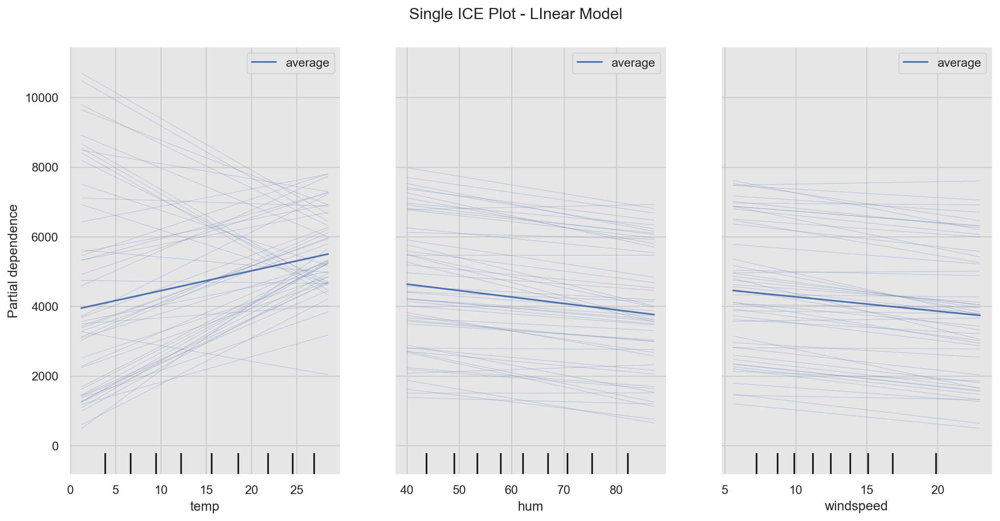

In [188]:
features_to_display = ["temp", "hum", "windspeed"]

fig, ax = plt.subplots(figsize=(15, 7))

display_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train,
    features=features_to_display,
    kind="both",
    subsample=50,
    n_jobs=2,
    grid_resolution=20,
    random_state=42,
    line_kw={"color": "b", "linestyle": "-"},
    ax=ax
)

fig.suptitle("Single ICE Plot - LInear Model", y=0.95) ; 

In [189]:
linear_model_effects_df["temp"].abs().mean(axis=0)

380.7515336272566

### temp와 다른 feature의 상호작용 효과 

In [190]:
linear_model_effects_df.filter(regex=".temp").mean(axis=0).sort_values()

season_SUMMER temp                -236.035426
mnth_JUL temp                     -134.799969
season_WINTER temp                -113.813790
mnth_JUN temp                      -53.276266
mnth_MAR temp                      -19.402297
weathersit_MISTY temp              -17.440708
season_FALL temp                   -13.576754
mnth_APR temp                       -8.256222
workingday_NO WORKING DAY temp      -3.977498
mnth_DEC temp                       -2.437595
holiday_HOLIDAY temp                -0.043636
weekday_SAT temp                     0.000000
weekday_SUN temp                     0.000000
weekday_WED temp                     0.000000
workingday_WORKING DAY temp          0.000000
weathersit_GOOD temp                 0.000000
weekday_THU temp                     0.000000
weekday_MON temp                     0.000000
mnth_OCT temp                        0.000000
holiday_NO HOLIDAY temp              0.000000
mnth_SEP temp                        0.000000
mnth_NOV temp                     

In [191]:
sns_c

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

### mnth_JUL과의 ICE
- temp의 가중치는 양수인데, PDP 그래프에서 기울기가 음수인 직선들이 있음
   - 다른 feature와의 상호작용으로 생긴 것

In [193]:
X_train.query("mnth == 'JUL'")

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,days_since_2011,yr
181,SUMMER,JUL,NO HOLIDAY,FRI,WORKING DAY,GOOD,25.957500,39.6250,6.874736,181,2011
182,SUMMER,JUL,NO HOLIDAY,SAT,NO WORKING DAY,GOOD,26.701651,44.4583,7.709154,182,2011
183,SUMMER,JUL,NO HOLIDAY,SUN,NO WORKING DAY,MISTY,25.683349,68.2500,15.333486,183,2011
184,SUMMER,JUL,HOLIDAY,MON,NO WORKING DAY,MISTY,26.153349,63.7917,5.459106,184,2011
185,SUMMER,JUL,NO HOLIDAY,TUE,WORKING DAY,GOOD,27.093349,59.0417,8.459286,185,2011
...,...,...,...,...,...,...,...,...,...,...,...
573,SUMMER,JUL,NO HOLIDAY,FRI,WORKING DAY,GOOD,28.738349,59.4583,10.250464,573,2012
574,SUMMER,JUL,NO HOLIDAY,SAT,NO WORKING DAY,GOOD,27.524151,61.3333,10.542450,574,2012
575,SUMMER,JUL,NO HOLIDAY,SUN,NO WORKING DAY,GOOD,25.918349,62.3750,11.416532,575,2012
576,SUMMER,JUL,NO HOLIDAY,MON,WORKING DAY,GOOD,26.349151,66.8750,10.292339,576,2012


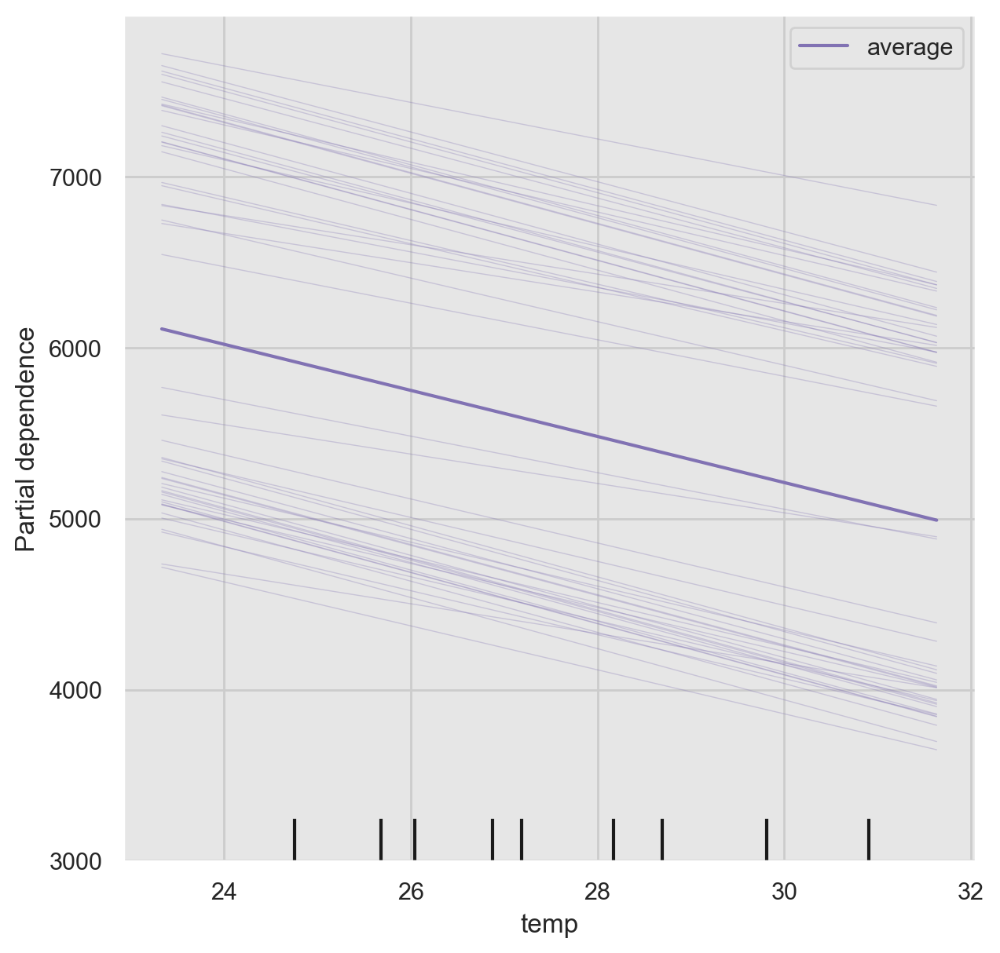

In [194]:
fig, ax = plt.subplots(figsize=(7, 7))

display_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train.query("mnth == 'JUL'"),
    features=["temp"],
    kind="both",
    subsample=50,
    n_jobs=2,
    grid_resolution=20,
    random_state=42,
    pd_line_kw={"color": sns_c[4], "linestyle": "-"},
    ice_lines_kw={"color": sns_c[4]},
    ax=ax
)

fit.suptitle("Single ICE Plot - Linear Model - Filtering form mnth = JUL") ;

### season_SUMMER 과의 ICE

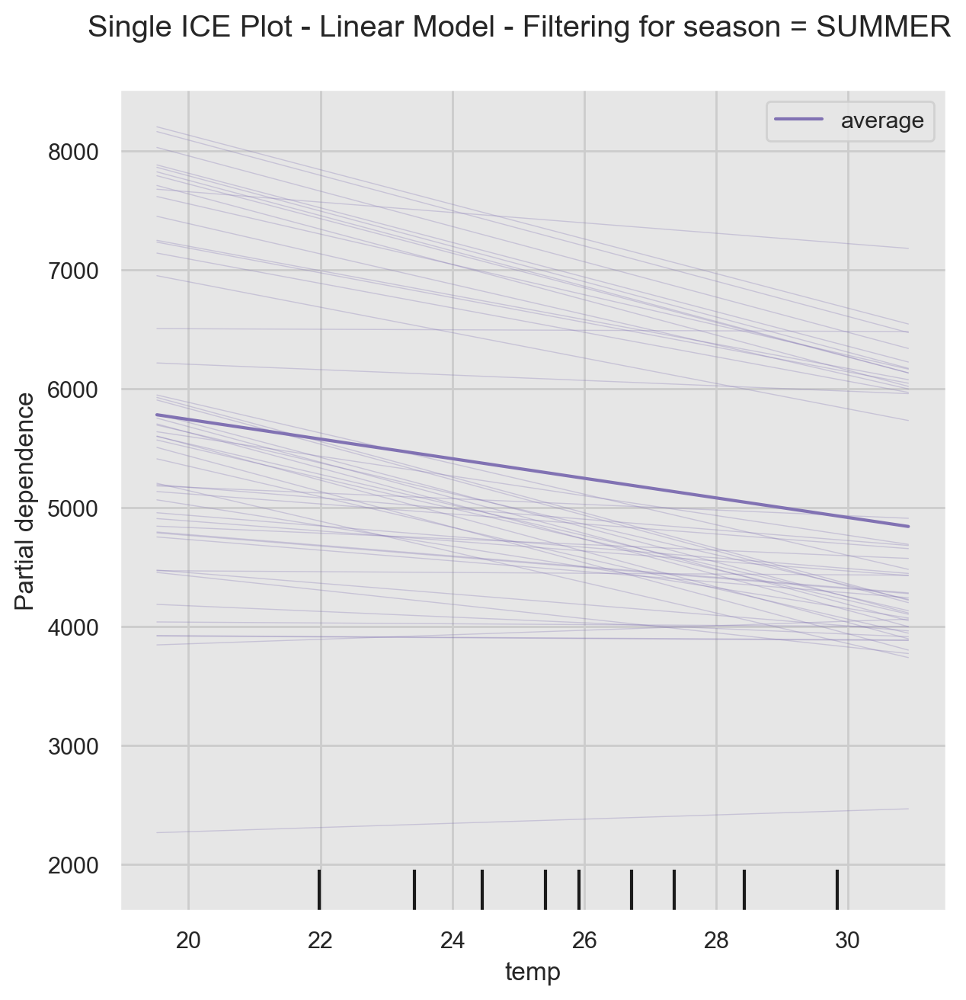

In [239]:
fig, ax = plt.subplots(figsize=(7, 7))

disp_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train.query("season == 'SUMMER'"),
    features=["temp"],
    kind="both",
    subsample=50,
    random_state=42,
    n_jobs=2,
    grid_resolution=20,
    pd_line_kw={"color": "m", "linestyle": "-"},
    ice_lines_kw={"color": "m"},
    ax=ax
)

fig.suptitle("Single ICE Plot - Linear Model - Filtering for season = SUMMER", 
             y=0.95) ;

### 두 feature 간 상호작용의 영향도 PDP
- temp, hum의 상호작용이 target에 미치는 영향도

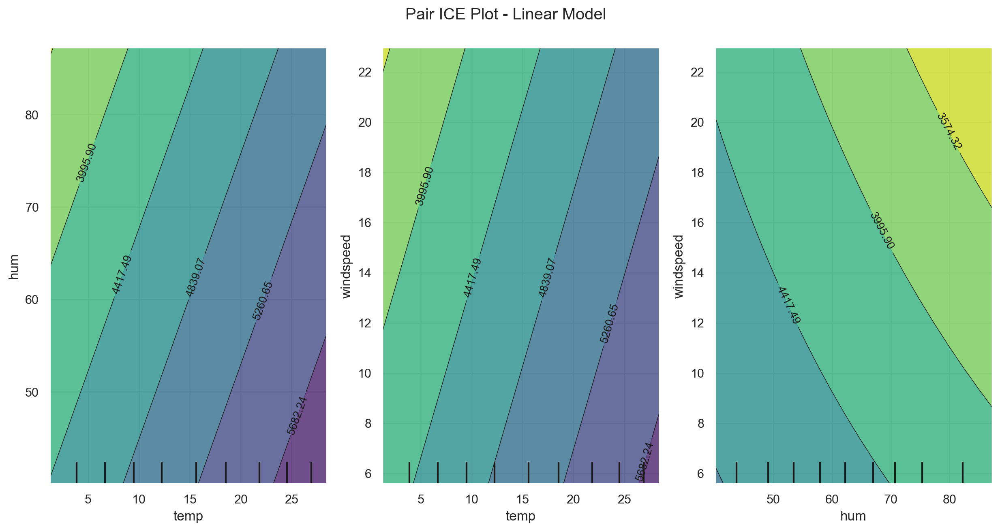

In [195]:
# 2-way PDP
# kind="average" : 디폴트

fig, ax = plt.subplots(figsize=(15, 7))

features_display = [
    ("temp", "hum"),
    ("temp", "windspeed"),
    ("hum", "windspeed")
]

display_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train,
    features=features_display,
    subsample=50,
    n_jobs=2,
    grid_resolution=20,
    random_state=42,
    contour_kw={"cmap": "viridis_r"},
    ax=ax
)

fig.suptitle("Pair ICE Plot - Linear Model", y=0.95) ; 

### 2-way PDP에서 선형관계의 의미
- temp-hum, tmep-windspeed는 선형관계로 나타남
- 이것의 coef 값을 확인하면 0.0이다.
   - 즉 target을 예측하는데 필요가 없다는 것

In [196]:
mask = linear_model_coef_df["linear_features"].isin(
    ["temp", "hum", "windspeed", "temp hum", "temp windspeed", "hum windspeed"]
)

mask

0      False
1      False
2      False
3      False
4      False
       ...  
480    False
481    False
482    False
483    False
484    False
Name: linear_features, Length: 485, dtype: bool

In [204]:
linear_model_coef_df[mask].style.background_gradient(cmap="viridis_r",
                                                    axis=0,
                                                    subset=["abs_coef_"])

,linear_features,coef_,abs_coef_
9,temp,438.628918,438.628918
44,hum,-137.549606,137.549606
58,windspeed,-99.599452,99.599452
90,hum windspeed,-36.603826,36.603826
232,temp hum,-0.000000,0.000000
264,temp windspeed,-0.000000,0.000000


In [203]:
X_train.columns[~X_train.columns.isin(numeric_features)].values

array(['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit'],
      dtype=object)

### tree based model의 PDP

### 1-way PDP

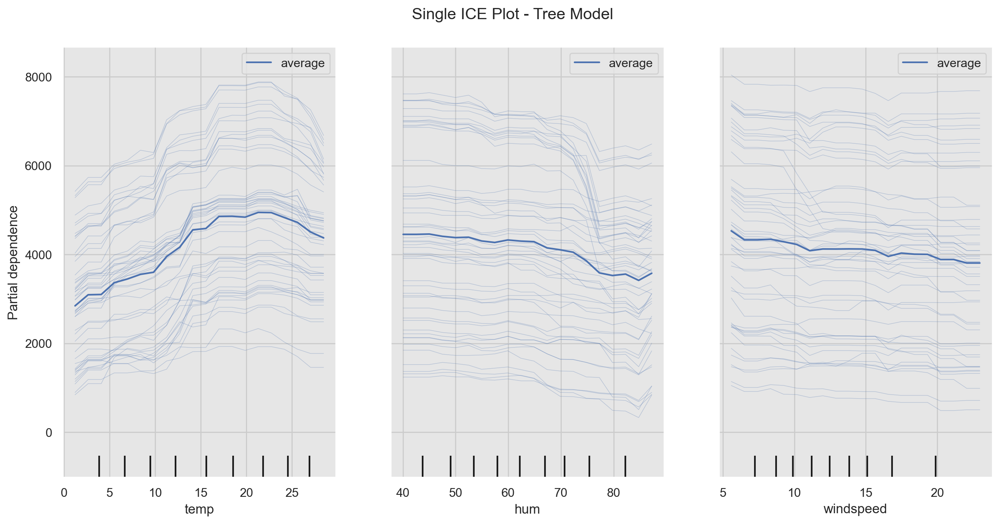

In [207]:
features_to_display = ["temp", "hum", "windspeed"]

fig, ax = plt.subplots(figsize=(15, 7))

display_tree = PartialDependenceDisplay.from_estimator(
    estimator=tree_grid_search,
    X=X_train,
    features=features_to_display,
    kind="both",
    subsample=50,
    n_jobs=2,
    line_kw={"color": "b", "linestyle": "-"},
    grid_resolution=20,
    random_state=42,
    ax=ax
)

fig.suptitle("Single ICE Plot - Tree Model", y=0.95) ; 

### 2-way PDP

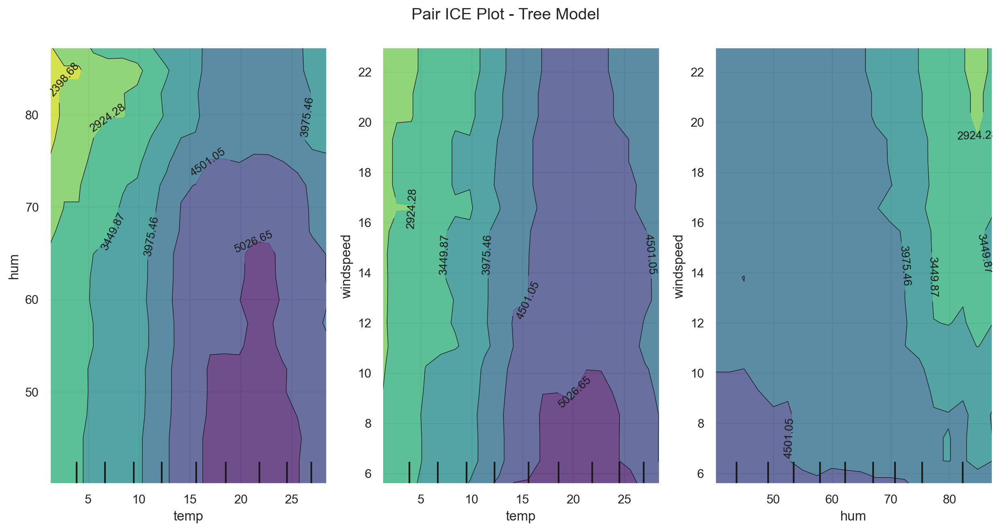

In [209]:
features_to_display = [
    ("temp", "hum"),
    ("temp", "windspeed"),
    ("hum", "windspeed")
]

fig, ax = plt.subplots(figsize=(15, 7))

display_tree = PartialDependenceDisplay.from_estimator(
    estimator=tree_grid_search,
    X=X_train,
    features=features_to_display,
    subsample=50,
    kind="average",
    n_jobs=2,
    grid_resolution=20, 
    contour_kw={"cmap": "viridis_r"},
    random_state=42,
    ax=ax
)

fig.suptitle("Pair ICE Plot - Tree Model", y=0.95) ;

### 2-way PDP를 3차원 그래프로

In [211]:
from sklearn.inspection import partial_dependence
from mpl_toolkits.mplot3d import Axes3D

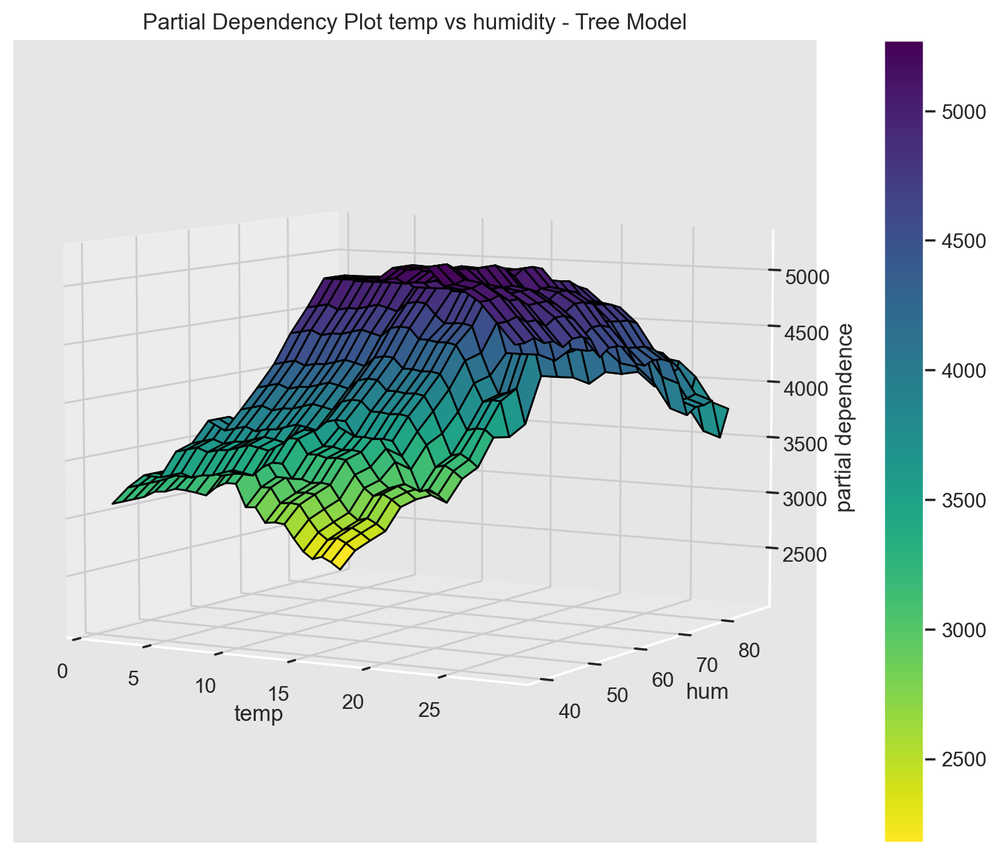

In [215]:
features_to_display = ["temp", "hum"]

pdp = partial_dependence(
    estimator=tree_grid_search,
    X=X_train,
    features=features_to_display,
    kind="average",
    grid_resolution=25
)

XX, YY = np.meshgrid(pdp["values"][0], pdp["values"][1])
ZZ = pdp.average[0].T

fig = plt.figure(figsize=(10, 6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
surf = ax.plot_surface(XX, YY, ZZ, 
                       rstride=1, 
                       cstride=1, 
                       cmap="viridis_r",
                       edgecolor="black")
ax.view_init(elev=7, azim=-60)
ax.set(
    title="Partial Dependency Plot temp vs humidity - Tree Model",
    xlabel=features_to_display[0],
    ylabel=features_to_display[1],
    zlabel="partial dependence"
)

fig.colorbar(surf) ; 

### linear, tree model의 ICE 비교
- 두 모델의 temp에 대한 영향도는 차이가 있다.
   - hum, windspeed는 거의 비슷하다.

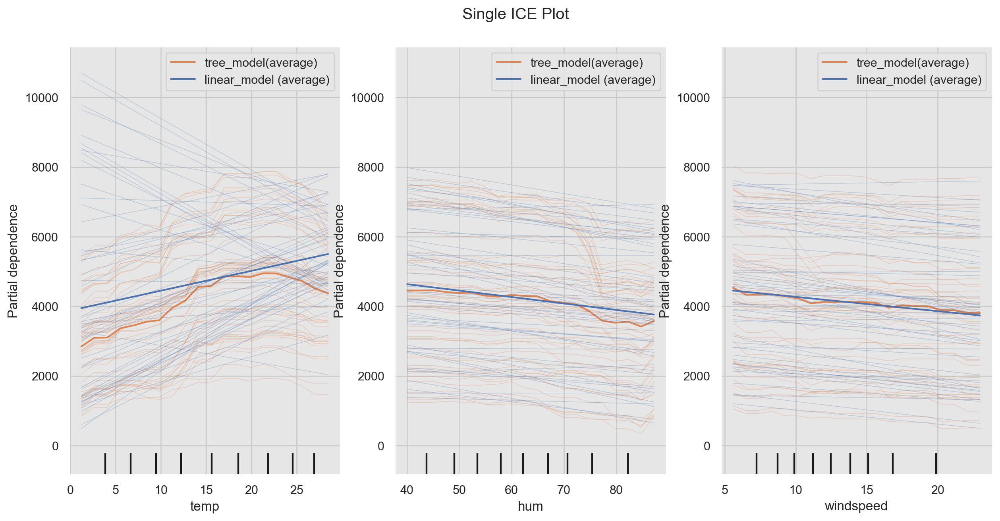

In [219]:
features_to_display = ["temp", "hum", "windspeed"]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7))

display_tree = PartialDependenceDisplay.from_estimator(
    estimator=tree_grid_search,
    X=X_train,
    features=features_to_display,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=20,
    random_state=42,
    line_kw={"color": sns_c[1],
             "linestyle": "-",
             "label": "tree_model(average)"},
    ax=ax
)

display_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train,
    features=features_to_display,
    kind="both",
    subsample=50,
    grid_resolution=20,
    n_jobs=2,
    random_state=42,
    line_kw={"color": sns_c[0],
             "linestyle": "-",
             "label": "linear_model (average)"},
    ax=ax
)

fig.suptitle("Single ICE Plot", y=0.95) ;

### 7월의 temp에 대한 두 모형의 영향도는 거의 유사하다.

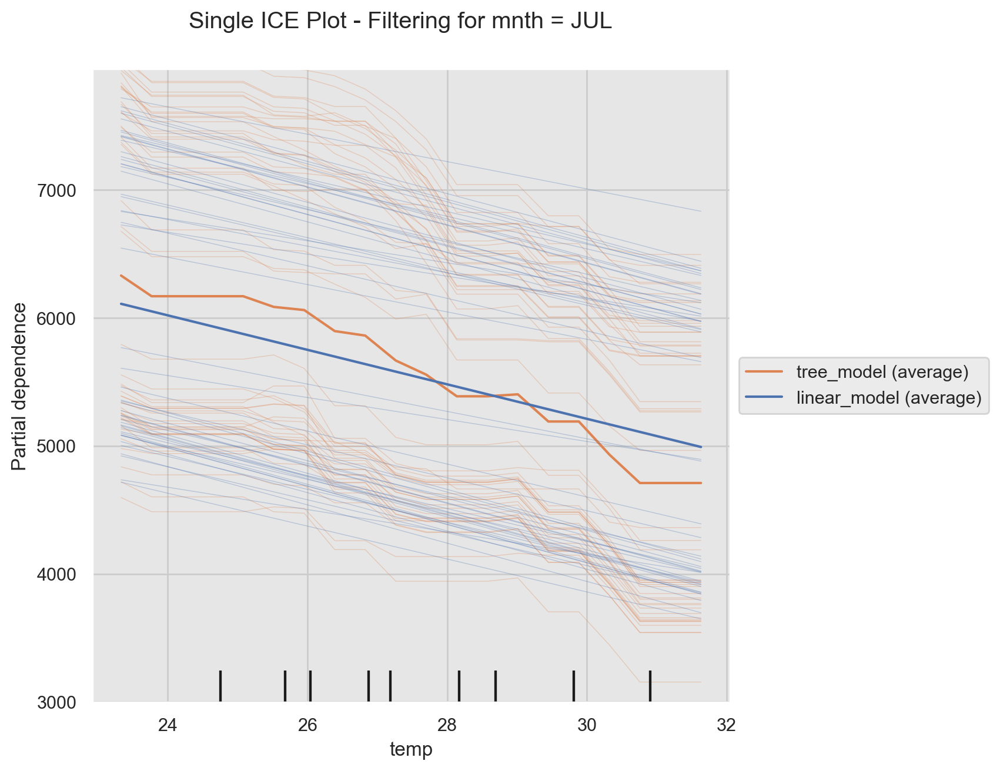

In [223]:
fig, ax = plt.subplots(figsize=(7, 7))

display_tree = PartialDependenceDisplay.from_estimator(
    estimator=tree_grid_search,
    X=X_train.query("mnth == 'JUL'"),
    features=["temp"],
    kind="both",
    subsample=50,
    n_jobs=2,
    grid_resolution=20,
    random_state=42,
    line_kw={"color": sns_c[1],
            "linestyle": "-",
            "label": "tree_model (average)"},
    ax=ax
)

display_linear = PartialDependenceDisplay.from_estimator(
    estimator=linear_grid_search,
    X=X_train.query("mnth == 'JUL'"),
    features=["temp"],
    kind="both",
    subsample=50,
    n_jobs=2,
    grid_resolution=20,
    random_state=42,
    line_kw={"color": sns_c[0],
            "linestyle": "-",
            "label": "linear_model (average)"},
    ax=display_tree.axes_
)

display_tree.axes_[0][0].legend(loc="center left", bbox_to_anchor=(1, 0.5))
fig.suptitle("Single ICE Plot - Filtering for mnth = JUL", y=0.95) ;

### 순열 중요도 Permutation Importance
- feature의 value를 순열한 후 모델의 예측 오류 증가를 측정한다. 이후 feature와 ture outcome의 관계를 깨뜨린다.
- 참고
   - https://scikit-learn.org/stable/modules/permutation_importance.html
   - https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html

In [224]:
from sklearn.inspection import permutation_importance

In [225]:
linear_pi = permutation_importance(
    estimator=linear_grid_search,
    X=X_train,
    y=y_train,
    n_repeats=10
)

tree_pi = permutation_importance(
    estimator=tree_grid_search,
    X=X_train,
    y=y_train,
    n_repeats=10
)

In [232]:
linear_pi["importances_mean"]

array([670.20509449, 380.88211646,  10.20042503,  45.34671006,
        48.30293782, 231.63794308, 991.44045961, 183.01961789,
       125.52968183, 675.47329043, 354.1587767 ])

In [233]:
tree_pi["importances_mean"]

array([  41.89515413,   50.78041302,    7.03801529,   61.66116508,
         31.18728314,  158.36897361,  810.80900481,  385.86018676,
        225.82742134, 1302.28715613,    0.        ])

In [234]:
# 작은 값부터 큰 값까지 인덱스를 정렬하고, 큰 값의 인덱스부터 반환

linear_perm_sorted_idx = linear_pi.importances_mean.argsort()[::-1]
linear_perm_sorted_idx

array([ 6,  9,  0,  1, 10,  5,  7,  8,  4,  3,  2], dtype=int64)

In [235]:
tree_perm_sorted_idx = tree_pi.importances_mean.argsort()[::-1]
tree_perm_sorted_idx

array([ 9,  6,  7,  8,  5,  3,  1,  0,  4,  2, 10], dtype=int64)

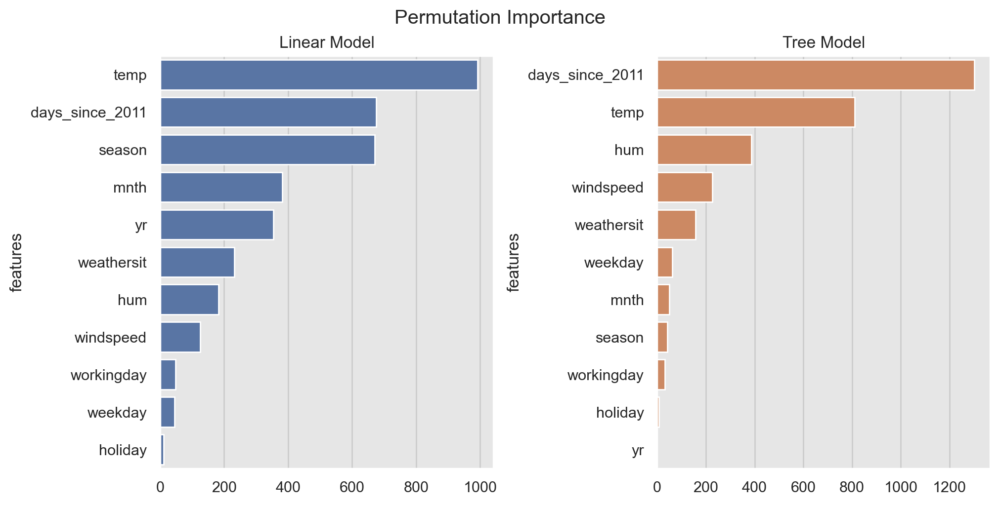

In [243]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), constrained_layout=True)

sns.barplot(
    x=linear_pi["importances_mean"][linear_perm_sorted_idx],
    y=X_train.columns[linear_perm_sorted_idx],
    orient="h",
    color=sns_c[0],
    ax=ax[0]
)
ax[0].set(title="Linear Model", ylabel="features")

sns.barplot(
    x=tree_pi["importances_mean"][tree_perm_sorted_idx],
    y=X_train.columns[tree_perm_sorted_idx],
    orient="h",
    color=sns_c[1],
    ax=ax[1]
)
ax[1].set(title="Tree Model", ylabel="features")
fig.suptitle("Permutation Importance") ;

### 상관관계를 고려한 순열 중요도
- 유사도 매트릭스를 사용하여 계층적 클러스터링 다이어그램 사용
   - spearman 상관계수를 사용하는 예

In [244]:
from scipy.stats import spearmanr
from scipy.cluster import hierarchy

In [247]:
corr = spearmanr(a=X_train).correlation
corr_linkage = hierarchy.ward(y=corr)

In [248]:
corr

array([[ 1.00000000e+00, -3.28823815e-01, -1.35754235e-02,
         3.83916989e-03, -9.38165365e-03, -6.03089361e-02,
        -2.51791902e-01, -2.25073906e-01,  1.09052505e-01,
        -1.58034606e-01,  1.91128331e-01],
       [-3.28823815e-01,  1.00000000e+00, -4.06215521e-03,
         1.48514587e-02,  7.58728609e-03,  8.05882913e-02,
         1.63897730e-01,  2.56779790e-01, -1.64133764e-01,
         4.31311839e-02, -1.22903308e-01],
       [-1.35754235e-02, -4.06215521e-03,  1.00000000e+00,
         1.36421007e-01,  2.47461082e-01,  3.90518499e-02,
         2.03466776e-02,  4.60443777e-02, -4.40221339e-02,
        -3.98221063e-03,  0.00000000e+00],
       [ 3.83916989e-03,  1.48514587e-02,  1.36421007e-01,
         1.00000000e+00,  2.00100919e-01,  3.21994778e-02,
         3.28802498e-02,  6.00187280e-02, -4.64526186e-03,
        -4.01673373e-03, -1.54742656e-03],
       [-9.38165365e-03,  7.58728609e-03,  2.47461082e-01,
         2.00100919e-01,  1.00000000e+00,  7.01450819e-02,
  

In [249]:
corr_linkage

array([[ 9.        , 10.        ,  0.53242805,  2.        ],
       [ 5.        ,  7.        ,  0.72952298,  2.        ],
       [ 2.        ,  4.        ,  1.06747762,  2.        ],
       [ 3.        , 13.        ,  1.21693531,  3.        ],
       [ 1.        ,  6.        ,  1.25402411,  2.        ],
       [ 0.        ,  8.        ,  1.28888448,  2.        ],
       [14.        , 15.        ,  1.81966376,  5.        ],
       [12.        , 17.        ,  1.97581979,  7.        ],
       [11.        , 16.        ,  2.27329697,  4.        ],
       [18.        , 19.        ,  2.64287445, 11.        ]])

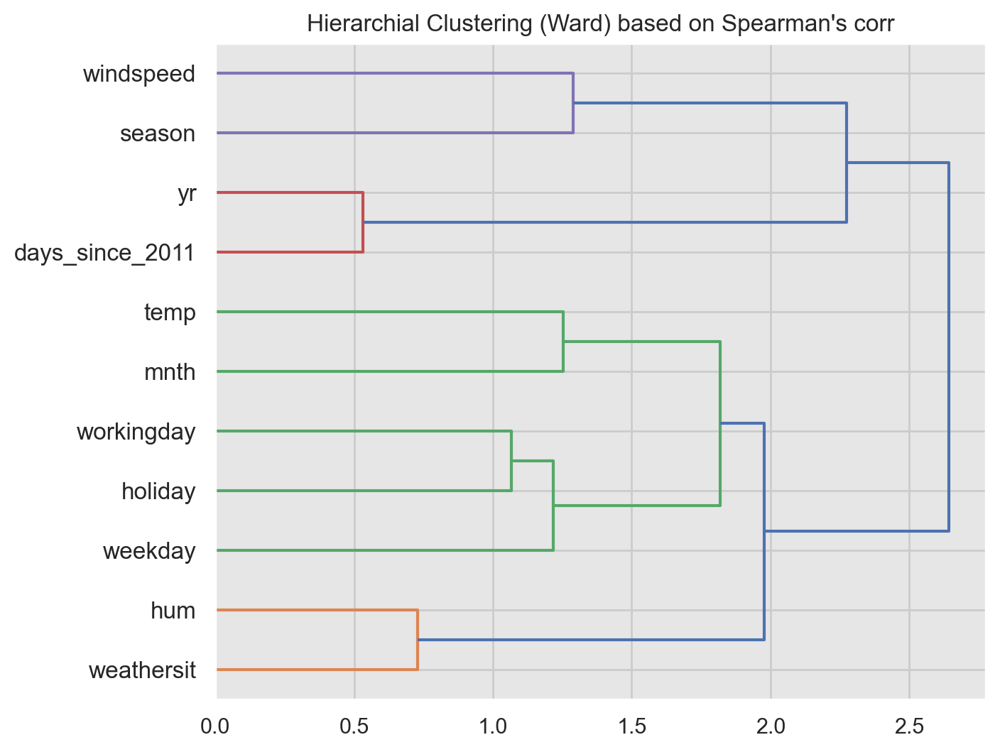

In [250]:
fig, ax = plt.subplots(figsize=(7, 6))
dendro = hierarchy.dendrogram(
    Z=corr_linkage,
    labels=X_train.columns,
    orientation="right",
    ax=ax
)
ax.set(title="Hierarchial Clustering (Ward) based on Spearman's corr") ;